In [1]:
#Created using NeuralNetwork_8_and_group_by, NeuralNetwork_9_and_min_max_all_emotions, NeuralNetwork_10_and_metrics

## Импорт библиотек

In [2]:
import os
import sqlite3
import pandas as pd
import numpy as np

In [3]:
import sys
sys.path.append('../')
from NeuralNetwork.tools import save_to_db, groupby
from NeuralNetwork.neural_network import NeuralNetwork

### Сбор всех данных в единый df ('Aleksashina_Керов_Андрей.db' + 'other.db')

In [4]:
list(os.walk('..'))

[('..',
  ['__pycache__',
   'Test',
   'NeuralNetwork',
   'architecture_models',
   '.ipynb_checkpoints',
   'saved_models',
   'By_dates',
   'Data',
   '.git'],
  ['Links.txt', 'New.txt', 'Интересно.txt', '.gitignore']),
 ('../__pycache__', [], ['neural_network.cpython-38.pyc']),
 ('../Test',
  ['.ipynb_checkpoints'],
  ['Test_4.ipynb',
   'Test_5&NeuralNetwork_7.ipynb',
   'Test_groupby.ipynb',
   'Test_6&NeuralNetwork_7.ipynb',
   'Test_1.ipynb',
   'Test_3.ipynb',
   'Test_2.ipynb']),
 ('../Test/.ipynb_checkpoints', [], ['Test_groupby-checkpoint.ipynb']),
 ('../NeuralNetwork',
  ['__pycache__', '.ipynb_checkpoints'],
  ['NeuralNetwork_1.ipynb',
   'NeuralNetwork_8_and_group_by.ipynb',
   'NeuralNetwork_3.ipynb',
   'NeuralNetwork_2.ipynb',
   'NeuralNetwork_6.ipynb',
   'tools.py',
   '__init__.py',
   'neural_network.py',
   'NeuralNetwork_10_and_metrics.ipynb',
   'NeuralNetwork_7.ipynb',
   'NeuralNetwork_4.ipynb',
   'NeuralNetwork_5.ipynb',
   'NeuralNetwork_9_and_min_max_a

In [5]:
databases = [dir_path for dir_path in os.walk('..') if 'train.db' in dir_path[2]][0]
databases

('../Data/databases',
 [],
 ['Aleksashina_Керов_Андрей.db', 'train.db', 'other.db'])

In [6]:
df = pd.DataFrame()

In [7]:
data_dir = databases[0]
for db_file in databases[2]:
    if db_file == 'train.db':
        continue
    db_path = os.path.join(data_dir, db_file)
    name_db = db_file[:-3]
    connection = sqlite3.connect(db_path)
    df_2 = pd.read_sql(f'select * from {name_db}', con=connection)
    df = pd.concat([df, df_2], axis=0)

In [8]:
df

,Index_,Video_Time,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,...,Action_Unit_12___Right___Lip_Corner_Puller,Action_Unit_14___Right___Dimpler,Action_Unit_15___Right___Lip_Corner_Depressor,Action_Unit_20___Right___Lip_Stretcher,Action_Unit_43___Right___Eyes_Closed,Stimulus,Event_Marker,UNKNOWN,Participant_Name,Analysis_Index
0,00:00:00.000_Керов Андрей_3,00:00:00.000,0.9878594,0.003336495,0.008397053,0.001824096,0.007600656,6.9452e-05,0.000141165,-0.005060558,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
1,00:00:00.030_Керов Андрей_3,00:00:00.030,0.9878824,0.003385304,0.008362157,0.001782566,0.007644675,8.0761e-05,0.000138702,-0.004976853,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
2,00:00:00.060_Керов Андрей_3,00:00:00.060,0.9879055,0.003434114,0.008327262,0.001741036,0.007688694,9.207e-05,0.00013624,-0.004893148,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
3,00:00:00.090_Керов Андрей_3,00:00:00.090,0.9879286,0.003482923,0.008292366,0.001699506,0.007732714,0.000103379,0.000133777,-0.004809443,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
4,00:00:00.121_Керов Андрей_3,00:00:00.121,0.9880258,0.003506238,0.008183754,0.00164466,0.00778434,0.000113112,0.000130297,-0.004677515,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20842,00:01:51.700_Куликов Алексей_1,00:01:51.700,0.9315634,3.7894e-05,0.02397099,0.06796286,0.02635098,0.000250268,0.000691861,-0.06792496,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1
20843,00:01:51.800_Куликов Алексей_1,00:01:51.800,0.9356429,3.1707e-05,0.0237766,0.06259692,0.02374056,0.000229404,0.000798602,-0.06256521,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1
20844,00:01:51.900_Куликов Алексей_1,00:01:51.900,0.9384109,2.6894e-05,0.023437,0.05935737,0.02117987,0.000212627,0.000848645,-0.05933048,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1
20845,00:01:52.000_Куликов Алексей_1,00:01:52.000,0.9407817,2.3125e-05,0.02303489,0.05651735,0.01901644,0.000197417,0.000877875,-0.05649422,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1


### Отбор нужных полей

In [9]:
pa_fields =     [
    'Valence',
    'Arousal'
]
seven_fields = [
    'Neutral', 
    'Happy', 
    'Sad', 
    'Angry', 
    'Surprised', 
    'Scared', 
    'Disgusted'
]

In [10]:
fields = seven_fields + pa_fields
fields

['Neutral',
 'Happy',
 'Sad',
 'Angry',
 'Surprised',
 'Scared',
 'Disgusted',
 'Valence',
 'Arousal']

## Разработка функции groupby для группировки датасета и округления + отбора по формуле (ln(len()) + 1) // Можно не прокликивать (см. ниже - Использование функции groupby)

In [11]:
df_fields = pd.DataFrame()
df_fields

""


### Округление значений в столбцах до 2-х знаков после запятой в 'Valence' и 'Arousal'. Остальные - без округления (пока что).

In [12]:
for field in seven_fields:
    df_fields[field] = df[field].apply(lambda x: float(x))

In [13]:
for field in pa_fields:
    df_fields[field] = df[field].apply(lambda x: round(float(x), 2))

### Округление значений в столбцах до 2-х знаков после запятой и group_by записей по 'Valence', 'Arousal'

In [14]:
df_fields

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
0,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.01,0.25
1,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.00,0.25
2,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.00,0.25
3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.00,0.25
4,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.00,0.25
...,...,...,...,...,...,...,...,...,...
20842,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.07,0.29
20843,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.06,0.29
20844,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.06,0.29
20845,0.940782,0.000023,0.023035,0.056517,0.019016,0.000197,0.000878,-0.06,0.29


In [15]:
df_fields.index = list(df['Index_'])
df_fields

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.01,0.25
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.00,0.25
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.00,0.25
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.00,0.25
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.00,0.25
...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.07,0.29
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.06,0.29
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.06,0.29
00:01:52.000_Куликов Алексей_1,0.940782,0.000023,0.023035,0.056517,0.019016,0.000197,0.000878,-0.06,0.29


In [16]:
df_fields

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.01,0.25
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.00,0.25
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.00,0.25
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.00,0.25
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.00,0.25
...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.07,0.29
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.06,0.29
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.06,0.29
00:01:52.000_Куликов Алексей_1,0.940782,0.000023,0.023035,0.056517,0.019016,0.000197,0.000878,-0.06,0.29


In [17]:
group_by_fields = list(df_fields.groupby(['Valence', 'Arousal']))
group_by_fields

[((-1.0, 0.63),
                           Neutral     Happy       Sad     Angry  Surprised  \
  00:00:08.800_Nasyrov_7  0.003199  0.000007  0.001220  0.009853   0.000013   
  00:00:08.900_Nasyrov_7  0.002880  0.000007  0.001275  0.008921   0.000013   
  00:00:09.000_Nasyrov_7  0.002579  0.000007  0.001362  0.007960   0.000014   
  00:00:09.100_Nasyrov_7  0.002344  0.000007  0.001472  0.007126   0.000016   
  00:00:09.200_Nasyrov_7  0.002753  0.000010  0.001666  0.006799   0.000023   
  
                            Scared  Disgusted  Valence  Arousal  
  00:00:08.800_Nasyrov_7  0.000006   0.995350     -1.0     0.63  
  00:00:08.900_Nasyrov_7  0.000005   0.995851     -1.0     0.63  
  00:00:09.000_Nasyrov_7  0.000005   0.996320     -1.0     0.63  
  00:00:09.100_Nasyrov_7  0.000006   0.996674     -1.0     0.63  
  00:00:09.200_Nasyrov_7  0.000007   0.996268     -1.0     0.63  ),
 ((-0.99, 0.62),
                           Neutral     Happy       Sad     Angry  Surprised  \
  00:00:07.30

In [18]:
group_by_fields[0][1]

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:08.800_Nasyrov_7,0.003199,0.000007,0.001220,0.009853,0.000013,0.000006,0.995350,-1.0,0.63
00:00:08.900_Nasyrov_7,0.002880,0.000007,0.001275,0.008921,0.000013,0.000005,0.995851,-1.0,0.63
00:00:09.000_Nasyrov_7,0.002579,0.000007,0.001362,0.007960,0.000014,0.000005,0.996320,-1.0,0.63
00:00:09.100_Nasyrov_7,0.002344,0.000007,0.001472,0.007126,0.000016,0.000006,0.996674,-1.0,0.63
00:00:09.200_Nasyrov_7,0.002753,0.000010,0.001666,0.006799,0.000023,0.000007,0.996268,-1.0,0.63


In [19]:
len(group_by_fields[0][1])

5

In [20]:
groupby_fields_sorted = list(sorted(df_fields.groupby(['Valence', 'Arousal'])
                                    , key=lambda x: -len(x[1])))
groupby_fields_sorted

[((-0.0, 0.25),
                                    Neutral     Happy       Sad     Angry  \
  00:00:00.030_Керов Андрей_3      0.987882  0.003385  0.008362  0.001783   
  00:00:00.060_Керов Андрей_3      0.987905  0.003434  0.008327  0.001741   
  00:00:00.090_Керов Андрей_3      0.987929  0.003483  0.008292  0.001700   
  00:00:00.121_Керов Андрей_3      0.988026  0.003506  0.008184  0.001645   
  00:00:00.151_Керов Андрей_3      0.988123  0.003530  0.008075  0.001590   
  ...                                   ...       ...       ...       ...   
  00:01:51.900_Смолин Александр_1  0.997180  0.000107  0.000156  0.004070   
  00:01:52.000_Смолин Александр_1  0.997246  0.000112  0.000160  0.003903   
  00:01:52.100_Смолин Александр_1  0.997315  0.000116  0.000162  0.003758   
  00:01:52.200_Смолин Александр_1  0.997346  0.000121  0.000164  0.003634   
  00:01:52.300_Смолин Александр_1  0.997309  0.000125  0.000162  0.003701   
  
                                   Surprised    Scared  D

In [21]:
len(groupby_fields_sorted) # Всего групп

5066

### В каждой группе выбираем mean в столбце и округляем до 2-х знаков после запятой

In [22]:
group_1 = groupby_fields_sorted[0][1]
group_1

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.0,0.25
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.0,0.25
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.0,0.25
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.0,0.25
00:00:00.151_Керов Андрей_3,0.988123,0.003530,0.008075,0.001590,0.007836,0.000123,0.000127,-0.0,0.25
...,...,...,...,...,...,...,...,...,...
00:01:51.900_Смолин Александр_1,0.997180,0.000107,0.000156,0.004070,0.000438,0.000077,0.001604,-0.0,0.25
00:01:52.000_Смолин Александр_1,0.997246,0.000112,0.000160,0.003903,0.000450,0.000076,0.001718,-0.0,0.25
00:01:52.100_Смолин Александр_1,0.997315,0.000116,0.000162,0.003758,0.000461,0.000077,0.001770,-0.0,0.25
00:01:52.200_Смолин Александр_1,0.997346,0.000121,0.000164,0.003634,0.000482,0.000079,0.001896,-0.0,0.25


In [23]:
group_1_group_by_seven_fields = list(group_1.groupby(seven_fields))
group_1_group_by_seven_fields

[((0.7432312,
   0.07885978,
   0.07676768,
   0.00452699,
   0.01626511,
   0.01138596,
   0.01404603),
                                Neutral    Happy       Sad     Angry  Surprised  \
  00:00:11.696_Керов Андрей_7  0.743231  0.07886  0.076768  0.004527   0.016265   
  
                                 Scared  Disgusted  Valence  Arousal  
  00:00:11.696_Керов Андрей_7  0.011386   0.014046      0.0     0.25  ),
 ((0.7951721,
   3.7398e-05,
   0.000122659,
   0.000347153,
   0.4074617,
   0.001852303,
   0.000522503),
                             Neutral     Happy       Sad     Angry  Surprised  \
  00:00:00.000_Zaharova_10  0.795172  0.000037  0.000123  0.000347   0.407462   
  
                              Scared  Disgusted  Valence  Arousal  
  00:00:00.000_Zaharova_10  0.001852   0.000523     -0.0     0.25  ),
 ((0.7970487,
   3.6687e-05,
   0.000118518,
   0.000366471,
   0.4037697,
   0.001831437,
   0.000515911),
                             Neutral     Happy       Sad     An

In [24]:
len(group_1_group_by_seven_fields) # Смотрим сколько в группе подгрупп по seven-fields 
# (было актуально при округлении и их)

1072

In [25]:
group_1['Neutral']

00:00:00.030_Керов Андрей_3        0.987882
00:00:00.060_Керов Андрей_3        0.987905
00:00:00.090_Керов Андрей_3        0.987929
00:00:00.121_Керов Андрей_3        0.988026
00:00:00.151_Керов Андрей_3        0.988123
                                     ...   
00:01:51.900_Смолин Александр_1    0.997180
00:01:52.000_Смолин Александр_1    0.997246
00:01:52.100_Смолин Александр_1    0.997315
00:01:52.200_Смолин Александр_1    0.997346
00:01:52.300_Смолин Александр_1    0.997309
Name: Neutral, Length: 1072, dtype: float64

In [26]:
group_1['Neutral'] = round(group_1['Neutral'].mean(), 2)
group_1

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.030_Керов Андрей_3,0.99,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.0,0.25
00:00:00.060_Керов Андрей_3,0.99,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.0,0.25
00:00:00.090_Керов Андрей_3,0.99,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.0,0.25
00:00:00.121_Керов Андрей_3,0.99,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.0,0.25
00:00:00.151_Керов Андрей_3,0.99,0.003530,0.008075,0.001590,0.007836,0.000123,0.000127,-0.0,0.25
...,...,...,...,...,...,...,...,...,...
00:01:51.900_Смолин Александр_1,0.99,0.000107,0.000156,0.004070,0.000438,0.000077,0.001604,-0.0,0.25
00:01:52.000_Смолин Александр_1,0.99,0.000112,0.000160,0.003903,0.000450,0.000076,0.001718,-0.0,0.25
00:01:52.100_Смолин Александр_1,0.99,0.000116,0.000162,0.003758,0.000461,0.000077,0.001770,-0.0,0.25
00:01:52.200_Смолин Александр_1,0.99,0.000121,0.000164,0.003634,0.000482,0.000079,0.001896,-0.0,0.25


In [27]:
group_1['Happy'].mean()

0.0017227284720149254

In [28]:
fields

['Neutral',
 'Happy',
 'Sad',
 'Angry',
 'Surprised',
 'Scared',
 'Disgusted',
 'Valence',
 'Arousal']

In [29]:
for field in fields:
    group_1[field] = round(group_1[field].mean(), 2)

In [30]:
group_1

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.030_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.060_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.090_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.121_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.151_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
...,...,...,...,...,...,...,...,...,...
00:01:51.900_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.000_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.100_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.200_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25


In [31]:
groupby_fields_sorted[1][1]

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.01,0.25
00:00:01.030_Керов Андрей_3,0.988426,0.001933,0.007255,0.000316,0.010538,0.000271,0.000040,-0.01,0.25
00:00:01.060_Керов Андрей_3,0.987607,0.001868,0.007653,0.000298,0.010956,0.000285,0.000038,-0.01,0.25
00:00:01.090_Керов Андрей_3,0.986035,0.001801,0.008278,0.000281,0.011477,0.000319,0.000037,-0.01,0.25
00:00:01.121_Керов Андрей_3,0.982871,0.001732,0.009163,0.000264,0.012205,0.000382,0.000035,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:03.600_Бушунов Виктор_1,0.990596,0.000003,0.001814,0.014388,0.000848,0.000005,0.000232,-0.01,0.25
00:00:03.700_Бушунов Виктор_1,0.990552,0.000003,0.001750,0.014599,0.000843,0.000005,0.000225,-0.01,0.25
00:00:03.800_Бушунов Виктор_1,0.990477,0.000003,0.001669,0.014882,0.000859,0.000005,0.000220,-0.01,0.25
00:00:03.900_Бушунов Виктор_1,0.990587,0.000003,0.001596,0.014711,0.000866,0.000005,0.000217,-0.01,0.25


#### Теперь для всех так

In [32]:
for group in groupby_fields_sorted:
    for field in fields:
        group[1][field] = round(group[1][field].mean(), 2)

In [33]:
groupby_fields_sorted[1]

((-0.01, 0.25),
                                Neutral  Happy   Sad  Angry  Surprised  Scared  \
 00:00:00.000_Керов Андрей_3       0.99    0.0  0.01   0.01       0.01     0.0   
 00:00:01.030_Керов Андрей_3       0.99    0.0  0.01   0.01       0.01     0.0   
 00:00:01.060_Керов Андрей_3       0.99    0.0  0.01   0.01       0.01     0.0   
 00:00:01.090_Керов Андрей_3       0.99    0.0  0.01   0.01       0.01     0.0   
 00:00:01.121_Керов Андрей_3       0.99    0.0  0.01   0.01       0.01     0.0   
 ...                                ...    ...   ...    ...        ...     ...   
 00:00:03.600_Бушунов Виктор_1     0.99    0.0  0.01   0.01       0.01     0.0   
 00:00:03.700_Бушунов Виктор_1     0.99    0.0  0.01   0.01       0.01     0.0   
 00:00:03.800_Бушунов Виктор_1     0.99    0.0  0.01   0.01       0.01     0.0   
 00:00:03.900_Бушунов Виктор_1     0.99    0.0  0.01   0.01       0.01     0.0   
 00:00:04.000_Бушунов Виктор_1     0.99    0.0  0.01   0.01       0.01     0.0   


### В train датасет отберём данные по формуле ln(len(group)) + 1

In [34]:
np.log10(1000)

3.0

In [35]:
len_group = len(groupby_fields_sorted[0][1])
len_group

1072

In [36]:
ln_ = np.log10(len_group)
ln_

3.030194785356751

In [37]:
import random

In [38]:
beg=10 
end=100 
random_integer = random.randint(beg, end)
random_integer

56

In [39]:
round(ln_ + 1, 0)

4.0

In [40]:
ln_2 = 3.50
round(ln_2, 0)

4.0

In [42]:
groupby_fields_sorted[0][1]

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.030_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.060_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.090_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.121_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.151_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
...,...,...,...,...,...,...,...,...,...
00:01:51.900_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.000_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.100_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.200_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25


In [43]:
i = 2
groupby_fields_sorted[0][1].iloc[i:i + 1] # i-ый

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.090_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25


In [44]:
len_group = len(groupby_fields_sorted[0][1])
len_group

1072

In [45]:
all_i_without_one = set(range(len_group))
all_i_without_one.remove(i)

In [46]:
len(all_i_without_one)

1071

In [47]:
groupby_fields_sorted[0][1].iloc[list(all_i_without_one)] # все кроме i-го

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.030_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.060_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.121_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.151_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:00:00.181_Керов Андрей_3,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
...,...,...,...,...,...,...,...,...,...
00:01:51.900_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.000_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.100_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25
00:01:52.200_Смолин Александр_1,0.99,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.25


In [48]:
random.randint(0, 1)

0

In [49]:
s = set()
s

set()

In [50]:
s.add(1)

In [51]:
s

{1}

In [52]:
df_train = pd.DataFrame()
df_other = pd.DataFrame()
df_train

""


#### Сам отбор

In [58]:
for group in groupby_fields_sorted:
    len_group = len(group[1])
    ln_ = np.log10(len_group)
    rand_set = set()
    for _ in range(int(round(ln_, 0)) + 1):
        i = random.randint(0, len_group - 1)
        while i in rand_set:
            i = random.randint(0, len_group - 1)
        rand_set.add(i)
        df_train = pd.concat([df_train, group[1].iloc[i:i + 1]], axis=0)
    all_i_without_rand_set = set(range(len_group)) - rand_set
    df_other = pd.concat([df_other, group[1].iloc[list(all_i_without_rand_set)]], axis=0)

In [59]:
df_train

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:01.181_Керов Андрей_7,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:00.818_Керов Андрей_4,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:12.000_Балакин Владислав_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:11.757_Боим_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:01.400_Боим_4,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:17.500_Смолин Александр_1,0.02,0.96,0.00,0.00,0.00,0.0,0.0,0.96,0.90
00:00:20.900_Aleksashina_1,0.01,0.98,0.00,0.00,0.00,0.0,0.0,0.97,0.67
00:00:16.900_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.87
00:00:17.000_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.89


In [60]:
df_other

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:00.030_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,0.00,0.25
00:00:00.060_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,0.00,0.25
00:00:00.090_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,0.00,0.25
00:00:00.121_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,0.00,0.25
00:00:00.151_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,0.00,0.25
...,...,...,...,...,...,...,...,...,...
00:00:11.696_Fomin_6,0.05,0.93,0.0,0.0,0.00,0.0,0.0,0.93,0.78
00:00:04.030_Керов Андрей_2,0.04,0.94,0.0,0.0,0.00,0.0,0.0,0.94,0.53
00:00:11.878_Fomin_6,0.03,0.95,0.0,0.0,0.00,0.0,0.0,0.95,0.83
00:00:11.939_Fomin_6,0.03,0.95,0.0,0.0,0.00,0.0,0.0,0.95,0.84


### Проверка формулы

In [61]:
group_by_fields_train = list(df_train.groupby(['Valence', 'Arousal']))
group_by_fields_train

[((-1.0, 0.63),
                          Neutral  Happy  Sad  Angry  Surprised  Scared  \
  00:00:09.000_Nasyrov_7      0.0    0.0  0.0   0.01        0.0     0.0   
  00:00:09.100_Nasyrov_7      0.0    0.0  0.0   0.01        0.0     0.0   
  
                          Disgusted  Valence  Arousal  
  00:00:09.000_Nasyrov_7        1.0     -1.0     0.63  
  00:00:09.100_Nasyrov_7        1.0     -1.0     0.63  ),
 ((-0.99, 0.62),
                          Neutral  Happy  Sad  Angry  Surprised  Scared  \
  00:00:07.400_Nasyrov_7     0.01    0.0  0.0    0.0        0.0     0.0   
  
                          Disgusted  Valence  Arousal  
  00:00:07.400_Nasyrov_7       0.99    -0.99     0.62  ),
 ((-0.99, 0.63),
                          Neutral  Happy  Sad  Angry  Surprised  Scared  \
  00:00:07.600_Nasyrov_7     0.01    0.0  0.0   0.01        0.0     0.0   
  00:00:08.200_Nasyrov_7     0.01    0.0  0.0   0.01        0.0     0.0   
  
                          Disgusted  Valence  Arousal  
 

In [62]:
fields

['Neutral',
 'Happy',
 'Sad',
 'Angry',
 'Surprised',
 'Scared',
 'Disgusted',
 'Valence',
 'Arousal']

In [63]:
df_train.drop_duplicates(fields) # Просто, чтобы знать

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:01.181_Керов Андрей_7,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:01.400_Боим_4,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
00:00:06.800_Бушунов Виктор_1,0.98,0.00,0.01,0.02,0.00,0.0,0.0,-0.02,0.25
00:00:46.500_Бондаренко Денис_2,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.26
00:00:03.909_Fomin_4,0.97,0.00,0.01,0.03,0.00,0.0,0.0,-0.03,0.25
...,...,...,...,...,...,...,...,...,...
00:00:17.500_Смолин Александр_1,0.02,0.96,0.00,0.00,0.00,0.0,0.0,0.96,0.90
00:00:20.900_Aleksashina_1,0.01,0.98,0.00,0.00,0.00,0.0,0.0,0.97,0.67
00:00:16.900_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.87
00:00:17.000_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.89


In [64]:
sorted_group_by_fields_train = list(sorted(group_by_fields_train, key=lambda x: -len(x[1])))
sorted_group_by_fields_train

[((-0.02, 0.25),
                                 Neutral  Happy   Sad  Angry  Surprised  Scared  \
  00:00:06.800_Бушунов Виктор_1     0.98    0.0  0.01   0.02        0.0     0.0   
  00:00:03.575_Fomin_3              0.98    0.0  0.01   0.02        0.0     0.0   
  00:00:10.900_Provotorov_8         0.98    0.0  0.01   0.02        0.0     0.0   
  00:00:01.303_Fomin_3              0.98    0.0  0.01   0.02        0.0     0.0   
  
                                 Disgusted  Valence  Arousal  
  00:00:06.800_Бушунов Виктор_1        0.0    -0.02     0.25  
  00:00:03.575_Fomin_3                 0.0    -0.02     0.25  
  00:00:10.900_Provotorov_8            0.0    -0.02     0.25  
  00:00:01.303_Fomin_3                 0.0    -0.02     0.25  ),
 ((-0.01, 0.25),
                                   Neutral  Happy   Sad  Angry  Surprised  \
  00:00:01.400_Боим_4                 0.99    0.0  0.01   0.01       0.01   
  00:00:16.800_Лебедев Андрей_1       0.99    0.0  0.01   0.01       0.01   


In [65]:
for group in sorted_group_by_fields_train[100:105]:
    print(len(group[1]))

3
3
2
2
2


### Реализация функции groupby для NN.tools

In [180]:
test_df = df[fields][:10]
test_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.9878594,0.003336495,0.008397053,0.001824096,0.007600656,6.9452e-05,0.000141165,-0.005060558,0.2475
00:00:00.030_Керов Андрей_3,0.9878824,0.003385304,0.008362157,0.001782566,0.007644675,8.0761e-05,0.000138702,-0.004976853,0.2475
00:00:00.060_Керов Андрей_3,0.9879055,0.003434114,0.008327262,0.001741036,0.007688694,9.207e-05,0.00013624,-0.004893148,0.2475
00:00:00.090_Керов Андрей_3,0.9879286,0.003482923,0.008292366,0.001699506,0.007732714,0.000103379,0.000133777,-0.004809443,0.2475
00:00:00.121_Керов Андрей_3,0.9880258,0.003506238,0.008183754,0.00164466,0.00778434,0.000113112,0.000130297,-0.004677515,0.2475
00:00:00.151_Керов Андрей_3,0.9881229,0.003529554,0.008075143,0.001589814,0.007835966,0.000122846,0.000126816,-0.004545589,0.2475
00:00:00.181_Керов Андрей_3,0.9882407,0.00352891,0.007949188,0.00153241,0.007892516,0.000133328,0.000123103,-0.004420279,0.2475
00:00:00.212_Керов Андрей_3,0.9883914,0.003516626,0.007801611,0.001472076,0.007936152,0.000142203,0.00011907,-0.004284984,0.2475
00:00:00.242_Керов Андрей_3,0.9885378,0.00349336,0.007647431,0.001409587,0.008017984,0.000151903,0.000114847,-0.004154071,0.2475


In [168]:
def foo_df(df):
    pa_fields =     [
    'Valence',
    'Arousal'
    ]
    for field in pa_fields:
        df[field] = df[field].apply(lambda x: round(float(x), 2))

In [169]:
foo_df(test_df)

In [170]:
test_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.9878594,0.003336495,0.008397053,0.001824096,0.007600656,6.9452e-05,0.000141165,-0.01,0.25
00:00:00.030_Керов Андрей_3,0.9878824,0.003385304,0.008362157,0.001782566,0.007644675,8.0761e-05,0.000138702,-0.00,0.25
00:00:00.060_Керов Андрей_3,0.9879055,0.003434114,0.008327262,0.001741036,0.007688694,9.207e-05,0.00013624,-0.00,0.25
00:00:00.090_Керов Андрей_3,0.9879286,0.003482923,0.008292366,0.001699506,0.007732714,0.000103379,0.000133777,-0.00,0.25
00:00:00.121_Керов Андрей_3,0.9880258,0.003506238,0.008183754,0.00164466,0.00778434,0.000113112,0.000130297,-0.00,0.25
00:00:00.151_Керов Андрей_3,0.9881229,0.003529554,0.008075143,0.001589814,0.007835966,0.000122846,0.000126816,-0.00,0.25
00:00:00.181_Керов Андрей_3,0.9882407,0.00352891,0.007949188,0.00153241,0.007892516,0.000133328,0.000123103,-0.00,0.25
00:00:00.212_Керов Андрей_3,0.9883914,0.003516626,0.007801611,0.001472076,0.007936152,0.000142203,0.00011907,-0.00,0.25
00:00:00.242_Керов Андрей_3,0.9885378,0.00349336,0.007647431,0.001409587,0.008017984,0.000151903,0.000114847,-0.00,0.25


In [171]:
# При передаче df в ф-ю и изменении его внутри, он меняется снаружи

In [181]:
def foo_df_copy(df):
    pa_fields =     [
    'Valence',
    'Arousal'
    ]
    
    copy_df = df.copy()
    for field in pa_fields:
        copy_df[field] = copy_df[field].apply(lambda x: round(float(x), 2))
    return copy_df

In [182]:
foo_df_copy(test_df)

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.9878594,0.003336495,0.008397053,0.001824096,0.007600656,6.9452e-05,0.000141165,-0.01,0.25
00:00:00.030_Керов Андрей_3,0.9878824,0.003385304,0.008362157,0.001782566,0.007644675,8.0761e-05,0.000138702,-0.00,0.25
00:00:00.060_Керов Андрей_3,0.9879055,0.003434114,0.008327262,0.001741036,0.007688694,9.207e-05,0.00013624,-0.00,0.25
00:00:00.090_Керов Андрей_3,0.9879286,0.003482923,0.008292366,0.001699506,0.007732714,0.000103379,0.000133777,-0.00,0.25
00:00:00.121_Керов Андрей_3,0.9880258,0.003506238,0.008183754,0.00164466,0.00778434,0.000113112,0.000130297,-0.00,0.25
00:00:00.151_Керов Андрей_3,0.9881229,0.003529554,0.008075143,0.001589814,0.007835966,0.000122846,0.000126816,-0.00,0.25
00:00:00.181_Керов Андрей_3,0.9882407,0.00352891,0.007949188,0.00153241,0.007892516,0.000133328,0.000123103,-0.00,0.25
00:00:00.212_Керов Андрей_3,0.9883914,0.003516626,0.007801611,0.001472076,0.007936152,0.000142203,0.00011907,-0.00,0.25
00:00:00.242_Керов Андрей_3,0.9885378,0.00349336,0.007647431,0.001409587,0.008017984,0.000151903,0.000114847,-0.00,0.25


In [183]:
test_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.9878594,0.003336495,0.008397053,0.001824096,0.007600656,6.9452e-05,0.000141165,-0.005060558,0.2475
00:00:00.030_Керов Андрей_3,0.9878824,0.003385304,0.008362157,0.001782566,0.007644675,8.0761e-05,0.000138702,-0.004976853,0.2475
00:00:00.060_Керов Андрей_3,0.9879055,0.003434114,0.008327262,0.001741036,0.007688694,9.207e-05,0.00013624,-0.004893148,0.2475
00:00:00.090_Керов Андрей_3,0.9879286,0.003482923,0.008292366,0.001699506,0.007732714,0.000103379,0.000133777,-0.004809443,0.2475
00:00:00.121_Керов Андрей_3,0.9880258,0.003506238,0.008183754,0.00164466,0.00778434,0.000113112,0.000130297,-0.004677515,0.2475
00:00:00.151_Керов Андрей_3,0.9881229,0.003529554,0.008075143,0.001589814,0.007835966,0.000122846,0.000126816,-0.004545589,0.2475
00:00:00.181_Керов Андрей_3,0.9882407,0.00352891,0.007949188,0.00153241,0.007892516,0.000133328,0.000123103,-0.004420279,0.2475
00:00:00.212_Керов Андрей_3,0.9883914,0.003516626,0.007801611,0.001472076,0.007936152,0.000142203,0.00011907,-0.004284984,0.2475
00:00:00.242_Керов Андрей_3,0.9885378,0.00349336,0.007647431,0.001409587,0.008017984,0.000151903,0.000114847,-0.004154071,0.2475


In [188]:
def groupby(df, by=None):
    pa_fields =     [
    'Valence',
    'Arousal'
    ]
    seven_fields = [
        'Neutral', 
        'Happy', 
        'Sad', 
        'Angry', 
        'Surprised', 
        'Scared', 
        'Disgusted'
    ]
    
    if by is None:
        by = pa_fields
        
    df_copy = df[seven_fields + pa_fields].copy()
    
    for field in pa_fields:
        df_copy[field] = df_copy[field].apply(lambda x: round(float(x), 2))
    for field in seven_fields:
        df_copy[field] = df_copy[field].apply(lambda x: float(x))
    
    df_copy.index = df['Index_']
    
    groupby_fields_sorted = list(sorted(df_copy.groupby(by), key=lambda x: -len(x[1])))
    for group in groupby_fields_sorted:
        for field in seven_fields:
            group[1][field] = round(group[1][field].mean(), 2)
            
    df_train = pd.DataFrame()
    
    for group in groupby_fields_sorted:
        len_group = len(group[1])
        ln_ = np.log10(len_group)
        rand_set = set()
        for _ in range(int(round(ln_, 0)) + 1):
            i = random.randint(0, len_group - 1)
            while i in rand_set:
                i = random.randint(0, len_group - 1)
            rand_set.add(i)
            df_train = pd.concat([df_train, group[1].iloc[i:i + 1]], axis=0)
    
    return df_train

### Тест groupby

In [185]:
# Получим df_train (см. выше) из исходного df

In [186]:
df

,Index_,Video_Time,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,...,Action_Unit_12___Right___Lip_Corner_Puller,Action_Unit_14___Right___Dimpler,Action_Unit_15___Right___Lip_Corner_Depressor,Action_Unit_20___Right___Lip_Stretcher,Action_Unit_43___Right___Eyes_Closed,Stimulus,Event_Marker,UNKNOWN,Participant_Name,Analysis_Index
Index_,,,,,,,,,,,,,,,,,,,,,
00:00:00.000_Керов Андрей_3,00:00:00.000_Керов Андрей_3,00:00:00.000,0.9878594,0.003336495,0.008397053,0.001824096,0.007600656,6.9452e-05,0.000141165,-0.005060558,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
00:00:00.030_Керов Андрей_3,00:00:00.030_Керов Андрей_3,00:00:00.030,0.9878824,0.003385304,0.008362157,0.001782566,0.007644675,8.0761e-05,0.000138702,-0.004976853,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
00:00:00.060_Керов Андрей_3,00:00:00.060_Керов Андрей_3,00:00:00.060,0.9879055,0.003434114,0.008327262,0.001741036,0.007688694,9.207e-05,0.00013624,-0.004893148,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
00:00:00.090_Керов Андрей_3,00:00:00.090_Керов Андрей_3,00:00:00.090,0.9879286,0.003482923,0.008292366,0.001699506,0.007732714,0.000103379,0.000133777,-0.004809443,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
00:00:00.121_Керов Андрей_3,00:00:00.121_Керов Андрей_3,00:00:00.121,0.9880258,0.003506238,0.008183754,0.00164466,0.00778434,0.000113112,0.000130297,-0.004677515,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,00:01:51.700_Куликов Алексей_1,00:01:51.700,0.9315634,3.7894e-05,0.02397099,0.06796286,0.02635098,0.000250268,0.000691861,-0.06792496,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1
00:01:51.800_Куликов Алексей_1,00:01:51.800_Куликов Алексей_1,00:01:51.800,0.9356429,3.1707e-05,0.0237766,0.06259692,0.02374056,0.000229404,0.000798602,-0.06256521,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1
00:01:51.900_Куликов Алексей_1,00:01:51.900_Куликов Алексей_1,00:01:51.900,0.9384109,2.6894e-05,0.023437,0.05935737,0.02117987,0.000212627,0.000848645,-0.05933048,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1


In [187]:
df_train

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
00:00:01.181_Керов Андрей_7,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:00.818_Керов Андрей_4,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:12.000_Балакин Владислав_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:11.757_Боим_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:01.400_Боим_4,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:17.500_Смолин Александр_1,0.02,0.96,0.00,0.00,0.00,0.0,0.0,0.96,0.90
00:00:20.900_Aleksashina_1,0.01,0.98,0.00,0.00,0.00,0.0,0.0,0.97,0.67
00:00:16.900_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.87
00:00:17.000_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.89


In [189]:
groupby(df)

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:10.575_Боим_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:06.000_Бондаренко Денис_2,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:01.454_Керов Андрей_7,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:01:36.200_Смолин Александр_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:08.727_Боим_1,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:17.500_Смолин Александр_1,0.02,0.96,0.00,0.00,0.00,0.0,0.0,0.96,0.90
00:00:20.900_Aleksashina_1,0.01,0.98,0.00,0.00,0.00,0.0,0.0,0.97,0.67
00:00:16.900_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.87


## Использование функции groupby

In [11]:
df_train, df_other = groupby(df, other=True)
df_train

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:01:40.200_Смолин Александр_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:10.151_Боим_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:11.303_Боим_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:01:43.700_Смолин Александр_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:01:48.200_Смолин Александр_1,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:17.500_Смолин Александр_1,0.02,0.96,0.00,0.00,0.00,0.0,0.0,0.96,0.90
00:00:20.900_Aleksashina_1,0.01,0.98,0.00,0.00,0.00,0.0,0.0,0.97,0.67
00:00:16.900_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.87


In [12]:
df_other

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.030_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
00:00:00.060_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
00:00:00.090_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
00:00:00.121_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
00:00:00.151_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
...,...,...,...,...,...,...,...,...,...
00:00:11.696_Fomin_6,0.05,0.93,0.0,0.0,0.00,0.0,0.0,0.93,0.78
00:00:04.030_Керов Андрей_2,0.04,0.94,0.0,0.0,0.00,0.0,0.0,0.94,0.53
00:00:11.878_Fomin_6,0.03,0.95,0.0,0.0,0.00,0.0,0.0,0.95,0.83


## Разработка метода в NeuralNetwork create_train_df_from_diff для отбора обучающего датасета на основе ошибок для модели // Можно не прокликивать (см. ниже - Использование метода create_train_df_from_diff)

### Загружаем модель из сохранённых (пока одной хватит)

In [13]:
from tensorflow.keras.models import load_model

In [3]:
# list(range(2, 9))

In [15]:
saved_models = [dir_ for dir_ in list(os.walk('..')) 
                    if 'saved_models' in dir_[0]]
saved_models

[('../saved_models',
  ['model_6',
   'model_5',
   'model_7',
   'model_8',
   'model_4',
   'model_3',
   'model_2'],
  []),
 ('../saved_models/model_6',
  ['assets', 'variables'],
  ['keras_metadata.pb', 'saved_model.pb']),
 ('../saved_models/model_6/assets', [], []),
 ('../saved_models/model_6/variables',
  [],
  ['variables.index', 'variables.data-00000-of-00001']),
 ('../saved_models/model_5',
  ['assets', 'variables'],
  ['keras_metadata.pb', 'saved_model.pb']),
 ('../saved_models/model_5/assets', [], []),
 ('../saved_models/model_5/variables',
  [],
  ['variables.index', 'variables.data-00000-of-00001']),
 ('../saved_models/model_7',
  ['assets', 'variables'],
  ['keras_metadata.pb', 'saved_model.pb']),
 ('../saved_models/model_7/assets', [], []),
 ('../saved_models/model_7/variables',
  [],
  ['variables.index', 'variables.data-00000-of-00001']),
 ('../saved_models/model_8',
  ['assets', 'variables'],
  ['keras_metadata.pb', 'saved_model.pb']),
 ('../saved_models/model_8/asset

In [16]:
saved_models = saved_models[0]
saved_models

('../saved_models',
 ['model_6', 'model_5', 'model_7', 'model_8', 'model_4', 'model_3', 'model_2'],
 [])

In [17]:
dir_model = saved_models[0]
dir_model

'../saved_models'

In [18]:
N = 8

In [19]:
save_name = f'model_{N}'

In [20]:
path = os.path.join(dir_model, save_name)
path

'../saved_models/model_8'

In [21]:
df.index = df['Index_']

In [22]:
model = load_model(path)
nn = NeuralNetwork(df[pa_fields], df[seven_fields], model)

/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_x[field] = self.df_x[field].apply(lambda entry: float(entry))
/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_y[field] = self.df_y[field].apply(lambda entry: float(entry))


### Возьмём diff для модели

In [23]:
test = nn.get_test()
test

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.005061,0.247500
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.004977,0.247500
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.004893,0.247500
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.004809,0.247500
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.004678,0.247500
...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.067925,0.287489
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.062565,0.287139
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.059330,0.286695


In [24]:
len(test)

25321

In [25]:
diff_neutral = nn.get_diff(test).sort_values(by=['Neutral'])
diff_neutral

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:10.000_Nasyrov_1,-0.383267,0.002174,0.101311,-0.230585,0.013981,0.013319,0.191480
00:00:09.900_Nasyrov_1,-0.381936,0.002213,0.102325,-0.233538,0.014318,0.013570,0.194026
00:00:10.100_Nasyrov_1,-0.376089,0.002233,0.098756,-0.211914,0.013614,0.012903,0.175867
00:00:09.800_Nasyrov_1,-0.369545,0.002395,0.101618,-0.218207,0.014779,0.013709,0.180943
00:00:10.200_Nasyrov_1,-0.363605,0.002440,0.095827,-0.179573,0.013313,0.012607,0.154490
...,...,...,...,...,...,...,...
00:00:37.000_Aleksashina_1,0.627637,-0.499795,0.030223,-0.519709,0.032498,0.008379,0.004367
00:00:37.400_Aleksashina_1,0.629835,-0.482814,0.025439,-0.495737,0.032429,0.007413,0.002866
00:00:37.100_Aleksashina_1,0.631716,-0.496028,0.028023,-0.512579,0.032468,0.007952,0.003658


In [42]:
type(np.absolute(diff_neutral.Neutral))

pandas.core.series.Series

In [41]:
np.absolute(diff_neutral.Neutral) > 0.1

Index_
00:00:10.000_Nasyrov_1        True
00:00:09.900_Nasyrov_1        True
00:00:10.100_Nasyrov_1        True
00:00:09.800_Nasyrov_1        True
00:00:10.200_Nasyrov_1        True
                              ... 
00:00:37.000_Aleksashina_1    True
00:00:37.400_Aleksashina_1    True
00:00:37.100_Aleksashina_1    True
00:00:37.200_Aleksashina_1    True
00:00:37.300_Aleksashina_1    True
Name: Neutral, Length: 25321, dtype: bool

In [43]:
np.absolute(diff_neutral['Neutral']) > 0.1

Index_
00:00:10.000_Nasyrov_1        True
00:00:09.900_Nasyrov_1        True
00:00:10.100_Nasyrov_1        True
00:00:09.800_Nasyrov_1        True
00:00:10.200_Nasyrov_1        True
                              ... 
00:00:37.000_Aleksashina_1    True
00:00:37.400_Aleksashina_1    True
00:00:37.100_Aleksashina_1    True
00:00:37.200_Aleksashina_1    True
00:00:37.300_Aleksashina_1    True
Name: Neutral, Length: 25321, dtype: bool

In [27]:
diff_neutral_filter = diff_neutral[np.absolute(diff_neutral.Neutral) > 0.1]
diff_neutral_filter

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:10.000_Nasyrov_1,-0.383267,0.002174,0.101311,-0.230585,0.013981,0.013319,0.191480
00:00:09.900_Nasyrov_1,-0.381936,0.002213,0.102325,-0.233538,0.014318,0.013570,0.194026
00:00:10.100_Nasyrov_1,-0.376089,0.002233,0.098756,-0.211914,0.013614,0.012903,0.175867
00:00:09.800_Nasyrov_1,-0.369545,0.002395,0.101618,-0.218207,0.014779,0.013709,0.180943
00:00:10.200_Nasyrov_1,-0.363605,0.002440,0.095827,-0.179573,0.013313,0.012607,0.154490
...,...,...,...,...,...,...,...
00:00:37.000_Aleksashina_1,0.627637,-0.499795,0.030223,-0.519709,0.032498,0.008379,0.004367
00:00:37.400_Aleksashina_1,0.629835,-0.482814,0.025439,-0.495737,0.032429,0.007413,0.002866
00:00:37.100_Aleksashina_1,0.631716,-0.496028,0.028023,-0.512579,0.032468,0.007952,0.003658


In [28]:
diff_neutral_filter.index

Index(['00:00:10.000_Nasyrov_1', '00:00:09.900_Nasyrov_1',
       '00:00:10.100_Nasyrov_1', '00:00:09.800_Nasyrov_1',
       '00:00:10.200_Nasyrov_1', '00:00:00.100_Nasyrov_3',
       '00:00:00.000_Nasyrov_3', '00:00:00.200_Nasyrov_3',
       '00:00:09.700_Nasyrov_1', '00:00:10.300_Nasyrov_1',
       ...
       '00:00:37.600_Aleksashina_1', '00:00:36.800_Aleksashina_1',
       '00:00:38.000_Aleksashina_1', '00:00:37.500_Aleksashina_1',
       '00:00:36.900_Aleksashina_1', '00:00:37.000_Aleksashina_1',
       '00:00:37.400_Aleksashina_1', '00:00:37.100_Aleksashina_1',
       '00:00:37.200_Aleksashina_1', '00:00:37.300_Aleksashina_1'],
      dtype='object', name='Index_', length=16795)

In [29]:
fields

['Neutral',
 'Happy',
 'Sad',
 'Angry',
 'Surprised',
 'Scared',
 'Disgusted',
 'Valence',
 'Arousal']

In [30]:
columns = [field + '_x' for field in seven_fields] + pa_fields
columns

['Neutral_x',
 'Happy_x',
 'Sad_x',
 'Angry_x',
 'Surprised_x',
 'Scared_x',
 'Disgusted_x',
 'Valence',
 'Arousal']

In [31]:
diff_neutral_filter_pa = pd.merge(df, diff_neutral_filter, left_index=True, right_index=True)[columns]
diff_neutral_filter_pa.columns = fields
diff_neutral_filter_pa.insert(0, 'Index_', diff_neutral_filter_pa.index)
diff_neutral_filter_pa

,Index_,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,,
00:00:00.000_Керов Андрей_3,00:00:00.000_Керов Андрей_3,0.9878594,0.003336495,0.008397053,0.001824096,0.007600656,6.9452e-05,0.000141165,-0.005060558,0.2475
00:00:00.030_Керов Андрей_3,00:00:00.030_Керов Андрей_3,0.9878824,0.003385304,0.008362157,0.001782566,0.007644675,8.0761e-05,0.000138702,-0.004976853,0.2475
00:00:00.060_Керов Андрей_3,00:00:00.060_Керов Андрей_3,0.9879055,0.003434114,0.008327262,0.001741036,0.007688694,9.207e-05,0.00013624,-0.004893148,0.2475
00:00:00.090_Керов Андрей_3,00:00:00.090_Керов Андрей_3,0.9879286,0.003482923,0.008292366,0.001699506,0.007732714,0.000103379,0.000133777,-0.004809443,0.2475
00:00:00.121_Керов Андрей_3,00:00:00.121_Керов Андрей_3,0.9880258,0.003506238,0.008183754,0.00164466,0.00778434,0.000113112,0.000130297,-0.004677515,0.2475
...,...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,00:01:51.700_Куликов Алексей_1,0.9315634,3.7894e-05,0.02397099,0.06796286,0.02635098,0.000250268,0.000691861,-0.06792496,0.2874891
00:01:51.800_Куликов Алексей_1,00:01:51.800_Куликов Алексей_1,0.9356429,3.1707e-05,0.0237766,0.06259692,0.02374056,0.000229404,0.000798602,-0.06256521,0.2871388
00:01:51.900_Куликов Алексей_1,00:01:51.900_Куликов Алексей_1,0.9384109,2.6894e-05,0.023437,0.05935737,0.02117987,0.000212627,0.000848645,-0.05933048,0.2866954


In [32]:
for field in seven_fields:
    diff_neutral_filter_pa[field] = diff_neutral_filter_pa[field].apply(lambda x: float(x))

In [33]:
for field in pa_fields:
    diff_neutral_filter_pa[field] = diff_neutral_filter_pa[field].apply(lambda x: round(float(x), 2))

In [34]:
diff_neutral_filter_pa

,Index_,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,,
00:00:00.000_Керов Андрей_3,00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.01,0.25
00:00:00.030_Керов Андрей_3,00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.00,0.25
00:00:00.060_Керов Андрей_3,00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.00,0.25
00:00:00.090_Керов Андрей_3,00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.00,0.25
00:00:00.121_Керов Андрей_3,00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.00,0.25
...,...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.07,0.29
00:01:51.800_Куликов Алексей_1,00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.06,0.29
00:01:51.900_Куликов Алексей_1,00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.06,0.29


In [35]:
group_by_fields_neutral_pa = list(diff_neutral_filter_pa.groupby(['Valence', 'Arousal']))
group_by_fields_neutral_pa

[((-0.93, 0.68),
                                                        Index_   Neutral  \
  Index_                                                                   
  00:00:41.400_Бушунов Виктор_1  00:00:41.400_Бушунов Виктор_1  0.218604   
  
                                    Happy      Sad     Angry  Surprised  \
  Index_                                                                  
  00:00:41.400_Бушунов Виктор_1  0.000288  0.00075  0.931756   0.000962   
  
                                   Scared  Disgusted  Valence  Arousal  
  Index_                                                                
  00:00:41.400_Бушунов Виктор_1  0.000013   0.000592    -0.93     0.68  ),
 ((-0.89, 0.6),
                                                        Index_   Neutral  \
  Index_                                                                   
  00:01:22.100_Бушунов Виктор_1  00:01:22.100_Бушунов Виктор_1  0.259019   
  
                                    Happy       Sad     

In [36]:
sorted_group_by_fields_neutral_pa = list(sorted(group_by_fields_neutral_pa, key=lambda x: -len(x[1])))
sorted_group_by_fields_neutral_pa

[((-0.0, 0.25),
                                                            Index_   Neutral  \
  Index_                                                                       
  00:00:00.030_Керов Андрей_3          00:00:00.030_Керов Андрей_3  0.987882   
  00:00:00.060_Керов Андрей_3          00:00:00.060_Керов Андрей_3  0.987905   
  00:00:00.090_Керов Андрей_3          00:00:00.090_Керов Андрей_3  0.987929   
  00:00:00.121_Керов Андрей_3          00:00:00.121_Керов Андрей_3  0.988026   
  00:00:00.151_Керов Андрей_3          00:00:00.151_Керов Андрей_3  0.988123   
  ...                                                          ...       ...   
  00:01:51.900_Смолин Александр_1  00:01:51.900_Смолин Александр_1  0.997180   
  00:01:52.000_Смолин Александр_1  00:01:52.000_Смолин Александр_1  0.997246   
  00:01:52.100_Смолин Александр_1  00:01:52.100_Смолин Александр_1  0.997315   
  00:01:52.200_Смолин Александр_1  00:01:52.200_Смолин Александр_1  0.997346   
  00:01:52.300_Смолин Ал

In [37]:
sorted_group_by_fields_neutral_pa[0][1]

,Index_,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,,
00:00:00.030_Керов Андрей_3,00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.0,0.25
00:00:00.060_Керов Андрей_3,00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.0,0.25
00:00:00.090_Керов Андрей_3,00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.0,0.25
00:00:00.121_Керов Андрей_3,00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.0,0.25
00:00:00.151_Керов Андрей_3,00:00:00.151_Керов Андрей_3,0.988123,0.003530,0.008075,0.001590,0.007836,0.000123,0.000127,-0.0,0.25
...,...,...,...,...,...,...,...,...,...,...
00:01:51.900_Смолин Александр_1,00:01:51.900_Смолин Александр_1,0.997180,0.000107,0.000156,0.004070,0.000438,0.000077,0.001604,-0.0,0.25
00:01:52.000_Смолин Александр_1,00:01:52.000_Смолин Александр_1,0.997246,0.000112,0.000160,0.003903,0.000450,0.000076,0.001718,-0.0,0.25
00:01:52.100_Смолин Александр_1,00:01:52.100_Смолин Александр_1,0.997315,0.000116,0.000162,0.003758,0.000461,0.000077,0.001770,-0.0,0.25


In [38]:
for group in sorted_group_by_fields_neutral_pa:
    for field in fields:
        group[1][field] = round(group[1][field].mean(), 2)

In [39]:
sorted_group_by_fields_neutral_pa[3][1]

,Index_,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,,
00:00:01.212_Керов Андрей_3,00:00:01.212_Керов Андрей_3,0.99,0.0,0.01,0.01,0.01,0.0,0.0,-0.01,0.26
00:00:06.000_Керов Андрей_6,00:00:06.000_Керов Андрей_6,0.99,0.0,0.01,0.01,0.01,0.0,0.0,-0.01,0.26
00:00:06.030_Керов Андрей_6,00:00:06.030_Керов Андрей_6,0.99,0.0,0.01,0.01,0.01,0.0,0.0,-0.01,0.26
00:00:06.060_Керов Андрей_6,00:00:06.060_Керов Андрей_6,0.99,0.0,0.01,0.01,0.01,0.0,0.0,-0.01,0.26
00:00:06.090_Керов Андрей_6,00:00:06.090_Керов Андрей_6,0.99,0.0,0.01,0.01,0.01,0.0,0.0,-0.01,0.26
...,...,...,...,...,...,...,...,...,...,...
00:01:34.400_Балакин Владислав_1,00:01:34.400_Балакин Владислав_1,0.99,0.0,0.01,0.01,0.01,0.0,0.0,-0.01,0.26
00:01:34.500_Балакин Владислав_1,00:01:34.500_Балакин Владислав_1,0.99,0.0,0.01,0.01,0.01,0.0,0.0,-0.01,0.26
00:01:34.600_Балакин Владислав_1,00:01:34.600_Балакин Владислав_1,0.99,0.0,0.01,0.01,0.01,0.0,0.0,-0.01,0.26


### Реализация метода в NeuralNetwork create_train_df_from_diff для отбора обучающего датасета на основе ошибок для модели

In [185]:
nn

In [186]:
pa_fields = list(nn.df_x.columns)
pa_fields

['Valence', 'Arousal']

In [187]:
seven_fields = list(nn.df_y.columns)
seven_fields

['Neutral', 'Happy', 'Sad', 'Angry', 'Surprised', 'Scared', 'Disgusted']

In [188]:
columns = [field + '_x' for field in seven_fields] + pa_fields
columns

['Neutral_x',
 'Happy_x',
 'Sad_x',
 'Angry_x',
 'Surprised_x',
 'Scared_x',
 'Disgusted_x',
 'Valence',
 'Arousal']

In [189]:
index_df = pd.DataFrame(columns=['Index_'])
index_df

,Index_


In [190]:
test

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.005061,0.247500
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.004977,0.247500
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.004893,0.247500
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.004809,0.247500
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.004678,0.247500
...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.067925,0.287489
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.062565,0.287139
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.059330,0.286695


In [191]:
diff = nn.get_diff(test)
diff

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:00.000_Керов Андрей_3,-0.138522,0.068145,0.023779,0.049408,0.026650,0.009051,0.005340
00:00:00.030_Керов Андрей_3,-0.138520,0.068139,0.023801,0.049424,0.026607,0.009038,0.005338
00:00:00.060_Керов Андрей_3,-0.138519,0.068132,0.023824,0.049439,0.026563,0.009024,0.005336
00:00:00.090_Керов Андрей_3,-0.138517,0.068126,0.023846,0.049455,0.026519,0.009011,0.005334
00:00:00.121_Керов Андрей_3,-0.138576,0.068170,0.023935,0.049469,0.026469,0.008997,0.005331
...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,-0.107696,0.040360,0.016878,0.005381,0.004836,0.009810,0.008879
00:01:51.800_Куликов Алексей_1,-0.109947,0.042033,0.016100,0.008471,0.007499,0.009678,0.008304
00:01:51.900_Куликов Алексей_1,-0.111582,0.043105,0.015874,0.010375,0.010106,0.009608,0.007984


#### Не прокликивать - DEBUG

In [97]:
emotion = seven_fields[0]
diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
diff_cur_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:00.000_Керов Андрей_3,-0.138522,0.068145,0.023779,0.049408,0.026650,0.009051,0.005340
00:00:00.030_Керов Андрей_3,-0.138520,0.068139,0.023801,0.049424,0.026607,0.009038,0.005338
00:00:00.060_Керов Андрей_3,-0.138519,0.068132,0.023824,0.049439,0.026563,0.009024,0.005336
00:00:00.090_Керов Андрей_3,-0.138517,0.068126,0.023846,0.049455,0.026519,0.009011,0.005334
00:00:00.121_Керов Андрей_3,-0.138576,0.068170,0.023935,0.049469,0.026469,0.008997,0.005331
...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,-0.107696,0.040360,0.016878,0.005381,0.004836,0.009810,0.008879
00:01:51.800_Куликов Алексей_1,-0.109947,0.042033,0.016100,0.008471,0.007499,0.009678,0.008304
00:01:51.900_Куликов Алексей_1,-0.111582,0.043105,0.015874,0.010375,0.010106,0.009608,0.007984


In [99]:
emotion = seven_fields[1]
diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
diff_cur_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:28.600_Aleksashina_1,0.159632,-0.112983,0.011278,-0.080807,0.030227,0.005189,-0.000668
00:00:28.700_Aleksashina_1,0.182069,-0.118466,0.008029,-0.081819,0.030311,0.004521,-0.002597
00:00:28.800_Aleksashina_1,0.206592,-0.117882,0.006623,-0.084783,0.030468,0.004150,-0.003667
00:00:28.900_Aleksashina_1,0.232344,-0.110592,0.006078,-0.079858,0.030658,0.003971,-0.003872
00:00:29.000_Aleksashina_1,0.265817,-0.107043,0.006177,-0.074766,0.030948,0.004029,-0.003588
...,...,...,...,...,...,...,...
00:00:19.100_Бушунов Виктор_1,0.370456,-0.271340,0.005468,-0.255537,0.025107,0.003231,0.000597
00:00:19.200_Бушунов Виктор_1,0.325228,-0.228432,0.004617,-0.211533,0.024782,0.003054,0.000452
00:00:19.300_Бушунов Виктор_1,0.285483,-0.188079,0.004025,-0.172763,0.024526,0.002915,0.000354


In [100]:
emotion = seven_fields[2]
diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
diff_cur_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:03.696_Керов Андрей_5,-0.028495,0.014705,-0.101361,0.074804,-0.094907,0.003623,0.013605
00:00:03.727_Керов Андрей_5,-0.027788,0.014362,-0.103579,0.076022,-0.092726,0.003660,0.013924
00:00:03.757_Керов Андрей_5,-0.026680,0.013924,-0.106468,0.077636,-0.090350,0.003718,0.014351
00:00:03.787_Керов Андрей_5,-0.025889,0.013557,-0.108953,0.079055,-0.088223,0.003773,0.014729
00:00:03.818_Керов Андрей_5,-0.025528,0.013227,-0.111242,0.080386,-0.086051,0.003826,0.015087
...,...,...,...,...,...,...,...
00:01:42.800_Куликов Алексей_1,0.108259,0.009711,-0.296634,0.229509,0.030036,0.024293,0.122652
00:01:42.900_Куликов Алексей_1,0.114568,0.010979,-0.241170,0.196428,0.027349,0.021076,0.083762
00:01:43.000_Куликов Алексей_1,0.097244,0.012150,-0.194566,0.168836,0.024936,0.018206,0.058987


In [101]:
emotion = seven_fields[3]
diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
diff_cur_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:05.757_Керов Андрей_3,-0.108286,0.017434,-0.083916,0.100205,-0.002556,0.006834,0.015416
00:00:05.787_Керов Андрей_3,-0.107927,0.017413,-0.084152,0.100411,-0.002311,0.006877,0.015468
00:00:05.818_Керов Андрей_3,-0.107569,0.017391,-0.084388,0.100617,-0.002065,0.006921,0.015521
00:00:05.848_Керов Андрей_3,-0.107292,0.017420,-0.084323,0.100600,-0.001768,0.006959,0.015518
00:00:05.878_Керов Андрей_3,-0.107169,0.017513,-0.083872,0.100298,-0.001642,0.006981,0.015443
...,...,...,...,...,...,...,...
00:01:42.800_Куликов Алексей_1,0.108259,0.009711,-0.296634,0.229509,0.030036,0.024293,0.122652
00:01:42.900_Куликов Алексей_1,0.114568,0.010979,-0.241170,0.196428,0.027349,0.021076,0.083762
00:01:43.000_Куликов Алексей_1,0.097244,0.012150,-0.194566,0.168836,0.024936,0.018206,0.058987


In [102]:
emotion = seven_fields[4]
diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
diff_cur_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:02.727_Керов Андрей_5,0.058079,0.018532,-0.077123,0.085055,-0.100348,0.006658,0.013000
00:00:02.757_Керов Андрей_5,0.059072,0.017706,-0.081317,0.085924,-0.103870,0.006466,0.013399
00:00:02.787_Керов Андрей_5,0.058592,0.017067,-0.084771,0.086336,-0.106926,0.006254,0.013700
00:00:02.818_Керов Андрей_5,0.057153,0.016577,-0.087579,0.086387,-0.109286,0.006047,0.013916
00:00:02.848_Керов Андрей_5,0.054371,0.016273,-0.089485,0.085866,-0.111259,0.005825,0.013999
...,...,...,...,...,...,...,...
00:01:11.900_Куликов Алексей_1,0.207465,0.037652,-0.016303,0.045824,-0.207758,0.005823,0.006793
00:01:12.000_Куликов Алексей_1,0.210355,0.036562,-0.018464,0.047355,-0.185689,0.005951,0.006936
00:01:12.100_Куликов Алексей_1,0.220265,0.027005,-0.041538,0.057690,-0.159196,0.006486,0.008681


In [181]:
emotion = seven_fields[5]
diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
diff_cur_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:06.454_Korsakov_6,-0.049384,0.020349,0.032943,0.066685,-0.002338,-0.100081,0.009512
00:00:06.484_Korsakov_6,-0.029127,0.018189,0.035032,0.073008,-0.003693,-0.111858,0.010877
00:00:06.515_Korsakov_6,-0.009751,0.016454,0.036983,0.079019,-0.005058,-0.122340,0.012209
00:00:06.545_Korsakov_6,0.008031,0.015162,0.038635,0.084166,-0.006899,-0.130858,0.013403
00:00:06.575_Korsakov_6,0.024904,0.014101,0.040143,0.088915,-0.008697,-0.138393,0.014538
...,...,...,...,...,...,...,...
00:01:37.600_Куликов Алексей_1,-0.028954,0.024624,-0.044945,0.099513,-0.005771,-0.113761,0.014533
00:01:37.700_Куликов Алексей_1,-0.036380,0.024427,-0.044969,0.098628,-0.005417,-0.112442,0.014395
00:01:37.800_Куликов Алексей_1,-0.042668,0.024868,-0.048478,0.096622,-0.004745,-0.109012,0.013959


In [180]:
emotion = seven_fields[6]
diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
diff_cur_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:39.500_Aleksashina_1,0.462657,-0.324027,0.124683,-0.458600,0.036649,0.025051,0.112860
00:00:39.600_Aleksashina_1,0.431674,-0.303629,0.127933,-0.461091,0.036398,0.025543,0.127625
00:00:39.700_Aleksashina_1,0.408949,-0.287831,0.129858,-0.461434,0.036154,0.025779,0.137907
00:00:39.800_Aleksashina_1,0.388180,-0.273444,0.131265,-0.458761,0.035978,0.025952,0.145852
00:00:39.900_Aleksashina_1,0.363241,-0.258512,0.132578,-0.454548,0.035816,0.026123,0.153445
...,...,...,...,...,...,...,...
00:01:42.400_Куликов Алексей_1,0.106394,0.005873,-0.520552,0.305980,0.031862,0.027067,0.251694
00:01:42.500_Куликов Алексей_1,0.097443,0.006388,-0.486065,0.293236,0.031741,0.026642,0.227294
00:01:42.600_Куликов Алексей_1,0.103059,0.007250,-0.430534,0.271335,0.031226,0.025940,0.191331


In [114]:
diff_cur_emotion['Index_'] = diff_cur_emotion.index
diff_cur_emotion

<ipython-input-114-1132eff24280>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diff_cur_emotion['Index_'] = diff_cur_emotion.index


,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Index_
Index_,,,,,,,,
00:00:39.500_Aleksashina_1,0.462657,-0.324027,0.124683,-0.458600,0.036649,0.025051,0.112860,00:00:39.500_Aleksashina_1
00:00:39.600_Aleksashina_1,0.431674,-0.303629,0.127933,-0.461091,0.036398,0.025543,0.127625,00:00:39.600_Aleksashina_1
00:00:39.700_Aleksashina_1,0.408949,-0.287831,0.129858,-0.461434,0.036154,0.025779,0.137907,00:00:39.700_Aleksashina_1
00:00:39.800_Aleksashina_1,0.388180,-0.273444,0.131265,-0.458761,0.035978,0.025952,0.145852,00:00:39.800_Aleksashina_1
00:00:39.900_Aleksashina_1,0.363241,-0.258512,0.132578,-0.454548,0.035816,0.026123,0.153445,00:00:39.900_Aleksashina_1
...,...,...,...,...,...,...,...,...
00:01:42.400_Куликов Алексей_1,0.106394,0.005873,-0.520552,0.305980,0.031862,0.027067,0.251694,00:01:42.400_Куликов Алексей_1
00:01:42.500_Куликов Алексей_1,0.097443,0.006388,-0.486065,0.293236,0.031741,0.026642,0.227294,00:01:42.500_Куликов Алексей_1
00:01:42.600_Куликов Алексей_1,0.103059,0.007250,-0.430534,0.271335,0.031226,0.025940,0.191331,00:01:42.600_Куликов Алексей_1


In [115]:
for emotion in seven_fields:
    diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
#     diff_cur_emotion['Index_'] = diff_cur_emotion.index
    index_df = pd.concat([index_df, diff_cur_emotion], axis=0)

<ipython-input-115-5b6ff208225a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  diff_cur_emotion['Index_'] = diff_cur_emotion.index


In [116]:
index_df

,Index_,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
00:00:00.000_Керов Андрей_3,00:00:00.000_Керов Андрей_3,-0.138522,0.068145,0.023779,0.049408,0.026650,0.009051,0.005340
00:00:00.030_Керов Андрей_3,00:00:00.030_Керов Андрей_3,-0.138520,0.068139,0.023801,0.049424,0.026607,0.009038,0.005338
00:00:00.060_Керов Андрей_3,00:00:00.060_Керов Андрей_3,-0.138519,0.068132,0.023824,0.049439,0.026563,0.009024,0.005336
00:00:00.090_Керов Андрей_3,00:00:00.090_Керов Андрей_3,-0.138517,0.068126,0.023846,0.049455,0.026519,0.009011,0.005334
00:00:00.121_Керов Андрей_3,00:00:00.121_Керов Андрей_3,-0.138576,0.068170,0.023935,0.049469,0.026469,0.008997,0.005331
...,...,...,...,...,...,...,...,...
00:01:42.400_Куликов Алексей_1,00:01:42.400_Куликов Алексей_1,0.106394,0.005873,-0.520552,0.305980,0.031862,0.027067,0.251694
00:01:42.500_Куликов Алексей_1,00:01:42.500_Куликов Алексей_1,0.097443,0.006388,-0.486065,0.293236,0.031741,0.026642,0.227294
00:01:42.600_Куликов Алексей_1,00:01:42.600_Куликов Алексей_1,0.103059,0.007250,-0.430534,0.271335,0.031226,0.025940,0.191331
00:01:42.700_Куликов Алексей_1,00:01:42.700_Куликов Алексей_1,0.107979,0.008387,-0.364304,0.249287,0.030721,0.025080,0.154259


In [118]:
index_df = pd.DataFrame(pd.unique(index_df['Index_']))
index_df

,0
0,00:00:00.000_Керов Андрей_3
1,00:00:00.030_Керов Андрей_3
2,00:00:00.060_Керов Андрей_3
3,00:00:00.090_Керов Андрей_3
4,00:00:00.121_Керов Андрей_3
...,...
19772,00:01:06.200_Куликов Алексей_1
19773,00:01:07.200_Куликов Алексей_1
19774,00:01:07.300_Куликов Алексей_1
19775,00:01:07.400_Куликов Алексей_1


In [119]:
len(index_df)

19777

In [122]:
list(index_df.columns)

[0]

In [124]:
list(index_df.index)

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,


In [130]:
index_df.rename(columns={0: 'Index_'})

,Index_
0,NaN
1,00:00:00.000_Керов Андрей_3
2,00:00:00.030_Керов Андрей_3
3,00:00:00.060_Керов Андрей_3
4,00:00:00.090_Керов Андрей_3
...,...
19773,00:01:06.200_Куликов Алексей_1
19774,00:01:07.200_Куликов Алексей_1
19775,00:01:07.300_Куликов Алексей_1
19776,00:01:07.400_Куликов Алексей_1


#### Прокликивать

In [197]:
index_set = set()
for emotion in seven_fields:
    diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
    index_set = index_set.union(set(diff_cur_emotion.index))
#     diff_cur_emotion['Index_'] = diff_cur_emotion.index
#     index_df = pd.concat([index_df, diff_cur_emotion[['Index_']]], axis=0)

In [198]:
index_set

{'00:00:31.800_Бушунов Виктор_1',
 '00:00:01.700_Nasyrov_5',
 '00:00:09.700_Provotorov_8',
 '00:00:06.200_Лебедев Андрей_1',
 '00:00:04.000_Боим_5',
 '00:00:03.400_Бондаренко Денис_2',
 '00:01:37.100_Балакин Владислав_1',
 '00:01:08.900_Aleksashina_1',
 '00:01:50.500_Aleksashina_1',
 '00:00:11.696_Fomin_7',
 '00:00:05.454_Korsakov_9',
 '00:00:56.000_Лебедев Андрей_1',
 '00:00:06.060_Керов Андрей_5',
 '00:00:11.030_Fomin_4',
 '00:01:02.800_Куликов Алексей_1',
 '00:00:07.900_Левандовский Кирилл_1',
 '00:00:04.200_Zaharova_5',
 '00:00:56.700_Лебедев Андрей_1',
 '00:00:42.300_Смолин Александр_1',
 '00:00:43.900_Куликов Алексей_1',
 '00:00:07.818_Керов Андрей_4',
 '00:00:00.454_Fomin_5',
 '00:01:51.400_Смолин Александр_1',
 '00:00:02.500_Provotorov_3',
 '00:00:05.900_Nasyrov_1',
 '00:01:21.800_Лебедев Андрей_1',
 '00:00:09.600_Aleksashina_1',
 '00:00:10.575_Керов Андрей_6',
 '00:00:02.700_Боим_7',
 '00:00:02.818_Korsakov_9',
 '00:00:08.600_Zaharova_7',
 '00:00:31.200_Бушунов Виктор_1',
 '00

In [199]:
len(index_set)

19777

In [202]:
index_df = pd.DataFrame({'Index_': list(index_set)})
index_df

,Index_
0,00:00:31.800_Бушунов Виктор_1
1,00:00:01.700_Nasyrov_5
2,00:00:09.700_Provotorov_8
3,00:00:06.200_Лебедев Андрей_1
4,00:00:04.000_Боим_5
...,...
19772,00:00:56.500_Турчина Екатерина_1
19773,00:01:47.200_Aleksashina_1
19774,00:01:07.600_Лебедев Андрей_1
19775,00:00:07.242_Fomin_3


In [204]:
index_df.index = index_df['Index_']
index_df

,Index_
Index_,
00:00:31.800_Бушунов Виктор_1,00:00:31.800_Бушунов Виктор_1
00:00:01.700_Nasyrov_5,00:00:01.700_Nasyrov_5
00:00:09.700_Provotorov_8,00:00:09.700_Provotorov_8
00:00:06.200_Лебедев Андрей_1,00:00:06.200_Лебедев Андрей_1
00:00:04.000_Боим_5,00:00:04.000_Боим_5
...,...
00:00:56.500_Турчина Екатерина_1,00:00:56.500_Турчина Екатерина_1
00:01:47.200_Aleksashina_1,00:01:47.200_Aleksashina_1
00:01:07.600_Лебедев Андрей_1,00:01:07.600_Лебедев Андрей_1


In [ ]:
# index_df = pd.DataFrame(pd.unique(index_df['Index_']))
# index_df.index = index_df[0]

In [205]:
index_df.index

Index(['00:00:31.800_Бушунов Виктор_1', '00:00:01.700_Nasyrov_5',
       '00:00:09.700_Provotorov_8', '00:00:06.200_Лебедев Андрей_1',
       '00:00:04.000_Боим_5', '00:00:03.400_Бондаренко Денис_2',
       '00:01:37.100_Балакин Владислав_1', '00:01:08.900_Aleksashina_1',
       '00:01:50.500_Aleksashina_1', '00:00:11.696_Fomin_7',
       ...
       '00:00:08.800_Provotorov_3', '00:00:10.454_Керов Андрей_3',
       '00:00:06.242_Керов Андрей_9', '00:00:10.363_Fomin_3',
       '00:00:06.600_Боим_3', '00:00:56.500_Турчина Екатерина_1',
       '00:01:47.200_Aleksashina_1', '00:01:07.600_Лебедев Андрей_1',
       '00:00:07.242_Fomin_3', '00:00:00.500_Zaharova_3'],
      dtype='object', name='Index_', length=19777)

In [206]:
pd.merge(test, index_df, left_index=True, right_index=True)

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal,Index_
Index_,,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.005061,0.247500,00:00:00.000_Керов Андрей_3
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.004977,0.247500,00:00:00.030_Керов Андрей_3
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.004893,0.247500,00:00:00.060_Керов Андрей_3
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.004809,0.247500,00:00:00.090_Керов Андрей_3
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.004678,0.247500,00:00:00.121_Керов Андрей_3
...,...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.067925,0.287489,00:01:51.700_Куликов Алексей_1
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.062565,0.287139,00:01:51.800_Куликов Алексей_1
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.059330,0.286695,00:01:51.900_Куликов Алексей_1


In [207]:
columns # не нужен

['Neutral_x',
 'Happy_x',
 'Sad_x',
 'Angry_x',
 'Surprised_x',
 'Scared_x',
 'Disgusted_x',
 'Valence',
 'Arousal']

In [208]:
train_df = pd.merge(test, index_df, left_index=True, right_index=True)[seven_fields + pa_fields]
train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.005061,0.247500
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.004977,0.247500
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.004893,0.247500
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.004809,0.247500
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.004678,0.247500
...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.067925,0.287489
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.062565,0.287139
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.059330,0.286695


In [209]:
train_df.insert(0, 'Index_', train_df.index)

In [210]:
train_df

,Index_,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,,
00:00:00.000_Керов Андрей_3,00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.005061,0.247500
00:00:00.030_Керов Андрей_3,00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.004977,0.247500
00:00:00.060_Керов Андрей_3,00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.004893,0.247500
00:00:00.090_Керов Андрей_3,00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.004809,0.247500
00:00:00.121_Керов Андрей_3,00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.004678,0.247500
...,...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.067925,0.287489
00:01:51.800_Куликов Алексей_1,00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.062565,0.287139
00:01:51.900_Куликов Алексей_1,00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.059330,0.286695


In [211]:
groupby(train_df)

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.393_Керов Андрей_7,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:00.800_Боим_10,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:03.200_Zaharova_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:01:38.300_Смолин Александр_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:03.300_Zaharova_8,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:13.600_Смолин Александр_1,0.17,0.78,0.00,0.00,0.00,0.0,0.0,0.78,0.87
00:01:28.300_Турчина Екатерина_1,0.33,0.79,0.00,0.00,0.00,0.0,0.0,0.79,0.45
00:01:26.900_Турчина Екатерина_1,0.28,0.79,0.00,0.00,0.00,0.0,0.0,0.79,0.47


#### Непосредственно в классе

In [212]:
import pandas as pd
import re
import numpy as np
from itertools import chain


class NeuralNetwork:
    def __init__(self, x, y, model=None):
        self.df_x = x
        for field in self.df_x.columns:
            self.df_x[field] = self.df_x[field].apply(lambda entry: float(entry))
        self.df_y = y
        for field in self.df_y.columns:
            self.df_y[field] = self.df_y[field].apply(lambda entry: float(entry))
        self.model = model
        self.from_ = 0
        self.to = 1
    
    def get_df_xy(self, from_ = None, to = None, xy = None):
        if xy is None:
            xy = 'x'
        
        if from_ is None:
            from_ = self.from_
        else:
            self.from_ = from_
            
        if to is None:
            to = self.to
        else:
            self.to = to
        
        if xy.lower() == 'x':   
            return self.df_x[from_:to]
        elif xy.lower() == 'y':   
            return self.df_y[from_:to]
    
    def predict(self, test=None):
        if self.model is None:
            raise Exception('You can use predict method only with model.')
    
        if test is None:
            df_x = self.get_df_xy(self.from_, self.to)
            df_res = pd.DataFrame(self.model.predict(df_x.values))
            df_res.columns = self.df_y.columns
            df_res.index = df_x.index
        else:
            assert all([column == self.df_y.columns[i] # ['Neutral', 'Happy', 'Sad', 'Angry',
                        for i, column in enumerate(test.columns[:7])]) # 'Surprised', 'Scared', 'Disgusted']
            df_res = pd.DataFrame(self.model.predict(test[['Valence', 'Arousal']].values))
            df_res.columns = self.df_y.columns
            df_res.index = test.index
        return df_res
    
    def get_test(self, n=None):
        if n is None:
            test = pd.concat([self.df_y, self.df_x], axis=1)
        else:
            test = pd.concat([self.df_y, self.df_x], axis=1).iloc[n:n+1]
        return test
    
    def get_diff(self, test):
        predict_df = self.predict(test)
        predict_values = predict_df.values
        predict_values -= test[test.columns[:7]].values
        diff_df = pd.DataFrame(predict_values)
        diff_df.columns = predict_df.columns
        diff_df.index = predict_df.index
        return diff_df
    
    def create_add_to_index(self, csv_file):   
        res = []
        without_participant = re.split('Participant \d*', csv_file)[1]
        fragments = re.split('Analysis ', without_participant)
        res.append(fragments[0])
        res.append(re.split('_video_', fragments[1])[0])
        return ''.join(res)
    
    def model_metric(self, test, type_='mean'):        
        if type_ == 'mean':
            array = np.absolute(self.get_diff(test).values)
            coefs = np.array(range(array.shape[1] + 1))[1:]
            for i in range(array.shape[0]):
                array[i].sort()
                array[i] *= coefs
            return np.sum(array) / (array.shape[0] * np.sum(coefs))
        elif type_ == 'norm':
            array = self.get_diff(test).values
            sum_ = 0
            for vector in array:
                sum_ += np.linalg.norm(vector)
            return sum_ / array.shape[0]
        elif type_ == 'stat':
            stat = self.statistics(test)
            vector = np.absolute(stat.values)
            return vector.mean()
        else:
            raise Exception('Unknown metric')
            
    def statistics(self, test):        
        diff = self.get_diff(test)
        columns = [['min_' + emotion, 'max_' + emotion, 'mean_abs_' + emotion]
                   for emotion in diff.columns]
        columns = list(chain.from_iterable(columns))
        statistics_df = pd.DataFrame(columns=columns)
        entry_dict = {}
        for emotion in diff.columns:
            entry_dict['min_' + emotion] = np.min(diff[emotion])
            entry_dict['max_' + emotion] = np.max(diff[emotion])
            entry_dict['mean_abs_' + emotion] = np.mean(np.absolute(diff[emotion]))
        statistics_df = statistics_df.append(entry_dict, ignore_index = True)
        return statistics_df

    def create_train_df_from_diff(self, test):
        pa_fields = list(self.df_x.columns)
        seven_fields = list(self.df_y.columns)
        
        index_df = pd.DataFrame(columns=['Index_'])
        
        diff = self.get_diff(test)
        
        index_set = set()
        for emotion in seven_fields:
            diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
            index_set = index_set.union(set(diff_cur_emotion.index))
        index_df = pd.DataFrame({'Index_': list(index_set)})
        index_df.index = index_df['Index_']
            
#         for emotion in seven_fields:
#             diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
#             diff_cur_emotion['Index_'] = diff_cur_emotion.index
#             index_df = pd.concat([index_df, diff_cur_emotion], axis=0)
#         index_df = pd.DataFrame(pd.unique(index_df['Index_']))
#         index_df.index = index_df[0]
        
        train_df = pd.merge(test, index_df, left_index=True, right_index=True)[seven_fields + pa_fields]
        train_df.insert(0, 'Index_', train_df.index)
        return groupby(train_df)

## Использование метода create_train_df_from_diff

In [11]:
from tensorflow.keras.models import load_model

In [12]:
saved_models = [dir_ for dir_ in list(os.walk('..')) 
                    if 'saved_models' in dir_[0]]
saved_models

[('../saved_models',
  ['model_6',
   'model_5',
   'model_7',
   'model_8',
   'model_4',
   'model_3',
   'model_2'],
  []),
 ('../saved_models/model_6',
  ['assets', 'variables'],
  ['keras_metadata.pb', 'saved_model.pb']),
 ('../saved_models/model_6/assets', [], []),
 ('../saved_models/model_6/variables',
  [],
  ['variables.index', 'variables.data-00000-of-00001']),
 ('../saved_models/model_5',
  ['assets', 'variables'],
  ['keras_metadata.pb', 'saved_model.pb']),
 ('../saved_models/model_5/assets', [], []),
 ('../saved_models/model_5/variables',
  [],
  ['variables.index', 'variables.data-00000-of-00001']),
 ('../saved_models/model_7',
  ['assets', 'variables'],
  ['keras_metadata.pb', 'saved_model.pb']),
 ('../saved_models/model_7/assets', [], []),
 ('../saved_models/model_7/variables',
  [],
  ['variables.index', 'variables.data-00000-of-00001']),
 ('../saved_models/model_8',
  ['assets', 'variables'],
  ['keras_metadata.pb', 'saved_model.pb']),
 ('../saved_models/model_8/asset

In [13]:
saved_models = saved_models[0]
saved_models

('../saved_models',
 ['model_6', 'model_5', 'model_7', 'model_8', 'model_4', 'model_3', 'model_2'],
 [])

In [14]:
dir_model = saved_models[0]
dir_model

'../saved_models'

In [15]:
N = 8
save_name = f'model_{N}'
path = os.path.join(dir_model, save_name)
path

'../saved_models/model_8'

In [16]:
df.index = df['Index_']

In [17]:
model = load_model(path)
nn = NeuralNetwork(df[pa_fields], df[seven_fields], model)

/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_x[field] = self.df_x[field].apply(lambda entry: float(entry))
/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_y[field] = self.df_y[field].apply(lambda entry: float(entry))


In [18]:
test = nn.get_test()
test

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.005061,0.247500
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.004977,0.247500
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.004893,0.247500
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.004809,0.247500
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.004678,0.247500
...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.067925,0.287489
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.062565,0.287139
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.059330,0.286695


In [19]:
train_df = nn.create_train_df_from_diff(test)
train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:27.200_Балакин Владислав_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:00:11.484_Боим_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:10.500_Балакин Владислав_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:01:39.500_Смолин Александр_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:08.151_Fomin_3,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:13.600_Смолин Александр_1,0.17,0.78,0.00,0.00,0.00,0.0,0.0,0.78,0.87
00:01:28.300_Турчина Екатерина_1,0.33,0.79,0.00,0.00,0.00,0.0,0.0,0.79,0.45
00:01:26.900_Турчина Екатерина_1,0.28,0.79,0.00,0.00,0.00,0.0,0.0,0.79,0.47


## Загружаем модели из сохранённых (2-8)

In [20]:
test

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.005061,0.247500
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.004977,0.247500
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.004893,0.247500
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.004809,0.247500
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.004678,0.247500
...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.067925,0.287489
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.062565,0.287139
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.059330,0.286695


In [21]:
models = []
N_list = list(range(2, 9))
N_list

[2, 3, 4, 5, 6, 7, 8]

In [22]:
for save_name in saved_models[1]:
    path = os.path.join(dir_model, save_name)
    model = load_model(path)
    models.append((save_name, model))

In [23]:
models

[('model_6', <keras.engine.functional.Functional at 0x7f7bc41eb280>),
 ('model_5', <keras.engine.functional.Functional at 0x7f7bc41eb6a0>),
 ('model_7', <keras.engine.functional.Functional at 0x7f7bc41eb5e0>),
 ('model_8', <keras.engine.functional.Functional at 0x7f7bc43771c0>),
 ('model_4', <keras.engine.functional.Functional at 0x7f7bc4354850>),
 ('model_3', <keras.engine.functional.Functional at 0x7f7bc40c78b0>),
 ('model_2', <keras.engine.functional.Functional at 0x7f7ba0771c70>)]

In [24]:
N = N_list[4]
N

6

In [25]:
model = models[0][1]
nn = NeuralNetwork(df[pa_fields], df[seven_fields], model)
train_df = nn.create_train_df_from_diff(test)

/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_x[field] = self.df_x[field].apply(lambda entry: float(entry))
/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_y[field] = self.df_y[field].apply(lambda entry: float(entry))


In [26]:
train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:06.575_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0,0.03,0.29
00:00:06.727_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0,0.03,0.29
00:00:07.030_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0,0.03,0.29
00:00:05.900_Provotorov_1,0.90,0.00,0.03,0.13,0.00,0.0,0.0,-0.14,0.30
00:01:37.700_Левандовский Кирилл_1,0.90,0.00,0.03,0.13,0.00,0.0,0.0,-0.14,0.30
...,...,...,...,...,...,...,...,...,...
00:01:28.400_Турчина Екатерина_1,0.35,0.78,0.00,0.00,0.00,0.0,0.0,0.78,0.45
00:01:26.800_Турчина Екатерина_1,0.29,0.78,0.00,0.00,0.00,0.0,0.0,0.78,0.47
00:01:28.300_Турчина Екатерина_1,0.33,0.79,0.00,0.00,0.00,0.0,0.0,0.79,0.45


## Метрики для моделей

In [27]:
df_metrics = pd.DataFrame(columns = ['N_model', 'mean', 'norm', 'stat'])
df_metrics

,N_model,mean,norm,stat


In [28]:
for model_pair in models:
    save_name = model_pair[0]
    model = model_pair[1]
    nn = NeuralNetwork(df[pa_fields], df[seven_fields], model)
    df_metrics = df_metrics.append({'N_model': save_name, 
                                    'mean': nn.model_metric(test, 'mean'),
                                    'norm': nn.model_metric(test, 'norm'),
                                    'stat': nn.model_metric(test, 'stat')}, ignore_index = True)
    print(save_name, 'metrics:', nn.model_metric(test, 'mean'), 
          nn.model_metric(test, 'norm'), nn.model_metric(test, 'stat'))

/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_x[field] = self.df_x[field].apply(lambda entry: float(entry))
/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_y[field] = self.df_y[field].apply(lambda entry: float(entry))


model_6 metrics: 0.06026403898056103 0.16646058736037253 0.3474605
model_5 metrics: 0.08011440580623368 0.23358801542260849 0.3232672
model_7 metrics: 0.0555611318968022 0.15221836792191387 0.3510847
model_8 metrics: 0.07492369956367385 0.20193463496216943 0.314459
model_4 metrics: 0.09040368653101322 0.24429082876818864 0.35706025
model_3 metrics: 0.11221548134453616 0.28805591560969945 0.3466652
model_2 metrics: 0.15920602896311362 0.41912014171906903 0.4223534


In [29]:
df_metrics

,N_model,mean,norm,stat
0,model_6,0.060264,0.166461,0.347461
1,model_5,0.080114,0.233588,0.323267
2,model_7,0.055561,0.152218,0.351085
3,model_8,0.074924,0.201935,0.314459
4,model_4,0.090404,0.244291,0.357060
5,model_3,0.112215,0.288056,0.346665
6,model_2,0.159206,0.419120,0.422353


### Дообучим модель (6) на train_df

In [30]:
model_pair = models[0]
model_pair

('model_6', <keras.engine.functional.Functional at 0x7f7bc41eb280>)

In [31]:
save_name = model_pair[0]
model = model_pair[1]

In [32]:
nn = NeuralNetwork(df[pa_fields], df[seven_fields], model)

/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_x[field] = self.df_x[field].apply(lambda entry: float(entry))
/home/ivan/Рабочий стол/Учёба/Git/NIR_1_sem_magistracy/Data/../NeuralNetwork/neural_network.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.df_y[field] = self.df_y[field].apply(lambda entry: float(entry))


In [33]:
test = nn.get_test()
test

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.000_Керов Андрей_3,0.987859,0.003336,0.008397,0.001824,0.007601,0.000069,0.000141,-0.005061,0.247500
00:00:00.030_Керов Андрей_3,0.987882,0.003385,0.008362,0.001783,0.007645,0.000081,0.000139,-0.004977,0.247500
00:00:00.060_Керов Андрей_3,0.987905,0.003434,0.008327,0.001741,0.007689,0.000092,0.000136,-0.004893,0.247500
00:00:00.090_Керов Андрей_3,0.987929,0.003483,0.008292,0.001700,0.007733,0.000103,0.000134,-0.004809,0.247500
00:00:00.121_Керов Андрей_3,0.988026,0.003506,0.008184,0.001645,0.007784,0.000113,0.000130,-0.004678,0.247500
...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,0.931563,0.000038,0.023971,0.067963,0.026351,0.000250,0.000692,-0.067925,0.287489
00:01:51.800_Куликов Алексей_1,0.935643,0.000032,0.023777,0.062597,0.023741,0.000229,0.000799,-0.062565,0.287139
00:01:51.900_Куликов Алексей_1,0.938411,0.000027,0.023437,0.059357,0.021180,0.000213,0.000849,-0.059330,0.286695


In [34]:
train_df = nn.create_train_df_from_diff(test)
train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:07.242_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0,0.03,0.29
00:00:07.393_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0,0.03,0.29
00:00:07.484_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0,0.03,0.29
00:00:08.600_Provotorov_1,0.90,0.00,0.03,0.13,0.00,0.0,0.0,-0.14,0.30
00:00:04.100_Provotorov_1,0.90,0.00,0.03,0.13,0.00,0.0,0.0,-0.14,0.30
...,...,...,...,...,...,...,...,...,...
00:01:28.400_Турчина Екатерина_1,0.35,0.78,0.00,0.00,0.00,0.0,0.0,0.78,0.45
00:01:26.800_Турчина Екатерина_1,0.29,0.78,0.00,0.00,0.00,0.0,0.0,0.78,0.47
00:01:28.300_Турчина Екатерина_1,0.33,0.79,0.00,0.00,0.00,0.0,0.0,0.79,0.45


In [35]:
# Пока рано

# for N in N_list:
#     save_name = f'model_{N}'
#     path = os.path.join(dir_model, save_name)
#     model = load_model(path)
#     nn = NeuralNetwork(df[pa_fields], df[seven_fields], model)
#     train_df = nn.create_train_df_from_diff(test)

In [36]:
pa_fields

['Valence', 'Arousal']

In [37]:
pa_vector = train_df[pa_fields]
pa_vector

,Valence,Arousal
Index_,,
00:00:07.242_Fomin_5,0.03,0.29
00:00:07.393_Fomin_5,0.03,0.29
00:00:07.484_Fomin_5,0.03,0.29
00:00:08.600_Provotorov_1,-0.14,0.30
00:00:04.100_Provotorov_1,-0.14,0.30
...,...,...
00:01:28.400_Турчина Екатерина_1,0.78,0.45
00:01:26.800_Турчина Екатерина_1,0.78,0.47
00:01:28.300_Турчина Екатерина_1,0.79,0.45


In [38]:
x = []
for i in range(len(pa_vector)):
    x.append((pa_vector['Valence'][i], pa_vector['Arousal'][i])) 
    
x = np.array(x)

In [39]:
x.shape

(4601, 2)

In [40]:
seven_fields

['Neutral', 'Happy', 'Sad', 'Angry', 'Surprised', 'Scared', 'Disgusted']

In [41]:
seven_vector = train_df[seven_fields]
seven_vector

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:07.242_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0
00:00:07.393_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0
00:00:07.484_Fomin_5,0.79,0.04,0.01,0.01,0.01,0.0,0.0
00:00:08.600_Provotorov_1,0.90,0.00,0.03,0.13,0.00,0.0,0.0
00:00:04.100_Provotorov_1,0.90,0.00,0.03,0.13,0.00,0.0,0.0
...,...,...,...,...,...,...,...
00:01:28.400_Турчина Екатерина_1,0.35,0.78,0.00,0.00,0.00,0.0,0.0
00:01:26.800_Турчина Екатерина_1,0.29,0.78,0.00,0.00,0.00,0.0,0.0
00:01:28.300_Турчина Екатерина_1,0.33,0.79,0.00,0.00,0.00,0.0,0.0


In [42]:
y = []
for i in range(len(pa_vector)):
    y.append(tuple(seven_vector[col][i] for col in seven_vector.columns)) 
y = np.array(y)

In [43]:
y.shape

(4601, 7)

In [44]:
model.fit(x=x, y=y, epochs=10, batch_size=30)

Epoch 1/10
154/154 [==============================] - 1s 2ms/step - loss: 0.0194
Epoch 2/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0175
Epoch 3/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0168
Epoch 4/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0164
Epoch 5/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0160
Epoch 6/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0158
Epoch 7/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0155
Epoch 8/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0154
Epoch 9/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0152
Epoch 10/10
154/154 [==============================] - 0s 2ms/step - loss: 0.0152


### Посмотрим на метрику

In [45]:
print(save_name, 'metrics:', nn.model_metric(test, 'mean'), 
          nn.model_metric(test, 'norm'), nn.model_metric(test, 'stat'))

model_6 metrics: 0.07452481455081045 0.20497142922302838 0.34096187


In [46]:
v = 2
df_metrics = df_metrics.append({'N_model': save_name + f'.{v}', 
                                    'mean': nn.model_metric(test, 'mean'),
                                    'norm': nn.model_metric(test, 'norm'),
                                    'stat': nn.model_metric(test, 'stat')}, ignore_index = True)

In [47]:
df_metrics

,N_model,mean,norm,stat
0,model_6,0.060264,0.166461,0.347461
1,model_5,0.080114,0.233588,0.323267
2,model_7,0.055561,0.152218,0.351085
3,model_8,0.074924,0.201935,0.314459
4,model_4,0.090404,0.244291,0.357060
5,model_3,0.112215,0.288056,0.346665
6,model_2,0.159206,0.419120,0.422353
7,model_6.2,0.074525,0.204971,0.340962


### Продолжаем обучение

In [48]:
dir(nn)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'create_add_to_index',
 'create_train_df_from_diff',
 'df_x',
 'df_y',
 'fit',
 'from_',
 'get_df_xy',
 'get_diff',
 'get_test',
 'model',
 'model_metric',
 'pa_fields',
 'predict',
 'seven_fields',
 'statistics',
 'to']

In [49]:
groupby

<function NeuralNetwork.tools.groupby(df, by=None, other=False)>

In [50]:
df

,Index_,Video_Time,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,...,Action_Unit_12___Right___Lip_Corner_Puller,Action_Unit_14___Right___Dimpler,Action_Unit_15___Right___Lip_Corner_Depressor,Action_Unit_20___Right___Lip_Stretcher,Action_Unit_43___Right___Eyes_Closed,Stimulus,Event_Marker,UNKNOWN,Participant_Name,Analysis_Index
Index_,,,,,,,,,,,,,,,,,,,,,
00:00:00.000_Керов Андрей_3,00:00:00.000_Керов Андрей_3,00:00:00.000,0.9878594,0.003336495,0.008397053,0.001824096,0.007600656,6.9452e-05,0.000141165,-0.005060558,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
00:00:00.030_Керов Андрей_3,00:00:00.030_Керов Андрей_3,00:00:00.030,0.9878824,0.003385304,0.008362157,0.001782566,0.007644675,8.0761e-05,0.000138702,-0.004976853,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
00:00:00.060_Керов Андрей_3,00:00:00.060_Керов Андрей_3,00:00:00.060,0.9879055,0.003434114,0.008327262,0.001741036,0.007688694,9.207e-05,0.00013624,-0.004893148,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
00:00:00.090_Керов Андрей_3,00:00:00.090_Керов Андрей_3,00:00:00.090,0.9879286,0.003482923,0.008292366,0.001699506,0.007732714,0.000103379,0.000133777,-0.004809443,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
00:00:00.121_Керов Андрей_3,00:00:00.121_Керов Андрей_3,00:00:00.121,0.9880258,0.003506238,0.008183754,0.00164466,0.00778434,0.000113112,0.000130297,-0.004677515,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Керов Андрей,Analysis 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
00:01:51.700_Куликов Алексей_1,00:01:51.700_Куликов Алексей_1,00:01:51.700,0.9315634,3.7894e-05,0.02397099,0.06796286,0.02635098,0.000250268,0.000691861,-0.06792496,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1
00:01:51.800_Куликов Алексей_1,00:01:51.800_Куликов Алексей_1,00:01:51.800,0.9356429,3.1707e-05,0.0237766,0.06259692,0.02374056,0.000229404,0.000798602,-0.06256521,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1
00:01:51.900_Куликов Алексей_1,00:01:51.900_Куликов Алексей_1,00:01:51.900,0.9384109,2.6894e-05,0.023437,0.05935737,0.02117987,0.000212627,0.000848645,-0.05933048,...,0.0,0.0,0.0,0.0,0.0,No Stimulus,No Event Marker,UNKNOWN,Куликов Алексей,Analysis 1


In [51]:
train_df, other_df = groupby(df, other=True)

In [52]:
train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:03.700_Бондаренко Денис_2,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:31.800_Балакин Владислав_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,0.00,0.25
00:01:46.600_Балакин Владислав_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:00.757_Керов Андрей_3,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:51.800_Бондаренко Денис_2,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:17.500_Смолин Александр_1,0.02,0.96,0.00,0.00,0.00,0.0,0.0,0.96,0.90
00:00:20.900_Aleksashina_1,0.01,0.98,0.00,0.00,0.00,0.0,0.0,0.97,0.67
00:00:16.900_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.87


In [53]:
other_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:00.030_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
00:00:00.060_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
00:00:00.090_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
00:00:00.121_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
00:00:00.151_Керов Андрей_3,0.99,0.00,0.0,0.0,0.01,0.0,0.0,-0.00,0.25
...,...,...,...,...,...,...,...,...,...
00:00:11.666_Fomin_6,0.05,0.93,0.0,0.0,0.00,0.0,0.0,0.93,0.78
00:00:04.060_Керов Андрей_2,0.04,0.94,0.0,0.0,0.00,0.0,0.0,0.94,0.53
00:00:11.878_Fomin_6,0.03,0.95,0.0,0.0,0.00,0.0,0.0,0.95,0.83


In [54]:
from sklearn.model_selection import train_test_split

In [55]:
X_train, X_test, y_train, y_test = train_test_split(other_df[seven_fields], other_df[pa_fields], test_size=0.4, random_state=42)

In [56]:
X_train

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:09.696_Керов Андрей_9,0.85,0.23,0.00,0.00,0.01,0.00,0.00
00:00:10.212_Керов Андрей_7,0.98,0.00,0.01,0.02,0.00,0.00,0.00
00:00:13.212_Fomin_4,0.98,0.00,0.01,0.01,0.01,0.00,0.00
00:00:00.303_Керов Андрей_5,0.99,0.00,0.00,0.00,0.01,0.00,0.00
00:00:03.300_Zaharova_7,0.25,0.03,0.31,0.00,0.00,0.00,0.35
...,...,...,...,...,...,...,...
00:00:05.121_Korsakov_6,0.74,0.00,0.01,0.04,0.08,0.04,0.00
00:00:07.151_Korsakov_8,0.78,0.00,0.01,0.05,0.01,0.01,0.01
00:00:10.181_Korsakov_10,0.97,0.00,0.00,0.00,0.05,0.00,0.00


In [57]:
X_train.sample(frac=1)

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:01:09.500_Балакин Владислав_1,0.98,0.02,0.00,0.01,0.00,0.00,0.00
00:01:32.900_Балакин Владислав_1,0.98,0.01,0.00,0.01,0.02,0.00,0.00
00:00:05.727_Fomin_3,0.97,0.00,0.01,0.02,0.01,0.00,0.00
00:00:09.212_Korsakov_1,0.85,0.00,0.02,0.06,0.03,0.00,0.01
00:00:02.030_Керов Андрей_2,0.99,0.00,0.00,0.00,0.01,0.00,0.00
...,...,...,...,...,...,...,...
00:00:05.100_Бондаренко Денис_2,0.99,0.00,0.00,0.00,0.01,0.00,0.00
00:00:09.636_Korsakov_9,0.97,0.00,0.00,0.01,0.01,0.00,0.01
00:00:24.000_Балакин Владислав_1,0.99,0.00,0.00,0.00,0.01,0.00,0.00


In [58]:
X_train

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:09.696_Керов Андрей_9,0.85,0.23,0.00,0.00,0.01,0.00,0.00
00:00:10.212_Керов Андрей_7,0.98,0.00,0.01,0.02,0.00,0.00,0.00
00:00:13.212_Fomin_4,0.98,0.00,0.01,0.01,0.01,0.00,0.00
00:00:00.303_Керов Андрей_5,0.99,0.00,0.00,0.00,0.01,0.00,0.00
00:00:03.300_Zaharova_7,0.25,0.03,0.31,0.00,0.00,0.00,0.35
...,...,...,...,...,...,...,...
00:00:05.121_Korsakov_6,0.74,0.00,0.01,0.04,0.08,0.04,0.00
00:00:07.151_Korsakov_8,0.78,0.00,0.01,0.05,0.01,0.01,0.01
00:00:10.181_Korsakov_10,0.97,0.00,0.00,0.00,0.05,0.00,0.00


In [59]:
df_split = pd.concat([X_train, y_train], axis=1)
df_split

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:09.696_Керов Андрей_9,0.85,0.23,0.00,0.00,0.01,0.00,0.00,0.23,0.38
00:00:10.212_Керов Андрей_7,0.98,0.00,0.01,0.02,0.00,0.00,0.00,-0.02,0.25
00:00:13.212_Fomin_4,0.98,0.00,0.01,0.01,0.01,0.00,0.00,-0.01,0.28
00:00:00.303_Керов Андрей_5,0.99,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.25
00:00:03.300_Zaharova_7,0.25,0.03,0.31,0.00,0.00,0.00,0.35,-0.62,0.56
...,...,...,...,...,...,...,...,...,...
00:00:05.121_Korsakov_6,0.74,0.00,0.01,0.04,0.08,0.04,0.00,-0.06,0.52
00:00:07.151_Korsakov_8,0.78,0.00,0.01,0.05,0.01,0.01,0.01,-0.06,0.48
00:00:10.181_Korsakov_10,0.97,0.00,0.00,0.00,0.05,0.00,0.00,-0.00,0.35


In [60]:
full_train_df = pd.concat([train_df, df_split], axis=0)
full_train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:03.700_Бондаренко Денис_2,0.99,0.0,0.00,0.00,0.01,0.00,0.00,-0.00,0.25
00:00:31.800_Балакин Владислав_1,0.99,0.0,0.00,0.00,0.01,0.00,0.00,0.00,0.25
00:01:46.600_Балакин Владислав_1,0.99,0.0,0.00,0.00,0.01,0.00,0.00,-0.00,0.25
00:00:00.757_Керов Андрей_3,0.99,0.0,0.00,0.00,0.01,0.00,0.00,-0.00,0.25
00:00:51.800_Бондаренко Денис_2,0.99,0.0,0.01,0.01,0.01,0.00,0.00,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:05.121_Korsakov_6,0.74,0.0,0.01,0.04,0.08,0.04,0.00,-0.06,0.52
00:00:07.151_Korsakov_8,0.78,0.0,0.01,0.05,0.01,0.01,0.01,-0.06,0.48
00:00:10.181_Korsakov_10,0.97,0.0,0.00,0.00,0.05,0.00,0.00,-0.00,0.35


In [61]:
full_train_df = full_train_df.sample(frac=1)
full_train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:59.900_Бушунов Виктор_1,0.85,0.00,0.03,0.19,0.02,0.0,0.0,-0.20,0.25
00:01:36.400_Лебедев Андрей_1,0.98,0.00,0.01,0.02,0.00,0.0,0.0,-0.02,0.25
00:00:00.000_Korsakov_4,0.96,0.01,0.00,0.00,0.05,0.0,0.0,0.00,0.31
00:00:10.151_Керов Андрей_7,0.97,0.00,0.01,0.03,0.00,0.0,0.0,-0.03,0.25
00:00:04.424_Керов Андрей_9,0.45,0.50,0.00,0.01,0.00,0.0,0.0,0.49,0.37
...,...,...,...,...,...,...,...,...,...
00:00:07.600_Aleksashina_1,0.97,0.00,0.01,0.03,0.01,0.0,0.0,-0.03,0.33
00:00:04.100_Zaharova_6,0.87,0.09,0.00,0.01,0.07,0.0,0.0,0.08,0.45
00:00:04.818_Керов Андрей_8,0.39,0.37,0.02,0.01,0.00,0.0,0.0,0.35,0.39


In [62]:
pa_vector = full_train_df[pa_fields]
pa_vector

,Valence,Arousal
Index_,,
00:00:59.900_Бушунов Виктор_1,-0.20,0.25
00:01:36.400_Лебедев Андрей_1,-0.02,0.25
00:00:00.000_Korsakov_4,0.00,0.31
00:00:10.151_Керов Андрей_7,-0.03,0.25
00:00:04.424_Керов Андрей_9,0.49,0.37
...,...,...
00:00:07.600_Aleksashina_1,-0.03,0.33
00:00:04.100_Zaharova_6,0.08,0.45
00:00:04.818_Керов Андрей_8,0.35,0.39


In [63]:
x = []
for i in range(len(pa_vector)):
    x.append((pa_vector['Valence'][i], pa_vector['Arousal'][i])) 
    
x = np.array(x)
x.shape

(17785, 2)

In [64]:
seven_vector = full_train_df[seven_fields]
seven_vector

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:59.900_Бушунов Виктор_1,0.85,0.00,0.03,0.19,0.02,0.0,0.0
00:01:36.400_Лебедев Андрей_1,0.98,0.00,0.01,0.02,0.00,0.0,0.0
00:00:00.000_Korsakov_4,0.96,0.01,0.00,0.00,0.05,0.0,0.0
00:00:10.151_Керов Андрей_7,0.97,0.00,0.01,0.03,0.00,0.0,0.0
00:00:04.424_Керов Андрей_9,0.45,0.50,0.00,0.01,0.00,0.0,0.0
...,...,...,...,...,...,...,...
00:00:07.600_Aleksashina_1,0.97,0.00,0.01,0.03,0.01,0.0,0.0
00:00:04.100_Zaharova_6,0.87,0.09,0.00,0.01,0.07,0.0,0.0
00:00:04.818_Керов Андрей_8,0.39,0.37,0.02,0.01,0.00,0.0,0.0


In [65]:
y = []
for i in range(len(pa_vector)):
    y.append(tuple(seven_vector[col][i] for col in seven_vector.columns)) 
y = np.array(y)
y.shape

(17785, 7)

In [66]:
model.fit(x=x, y=y, epochs=10, batch_size=30)

Epoch 1/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 2/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 3/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 4/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 5/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 6/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 7/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 8/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 9/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 10/10
593/593 [==============================] - 1s 2ms/step - loss: 0.0052


### Снова метрика

In [67]:
v = 3
df_metrics = df_metrics.append({'N_model': save_name + f'.{v}', 
                                    'mean': nn.model_metric(test, 'mean'),
                                    'norm': nn.model_metric(test, 'norm'),
                                    'stat': nn.model_metric(test, 'stat')}, ignore_index = True)

In [68]:
df_metrics

,N_model,mean,norm,stat
0,model_6,0.060264,0.166461,0.347461
1,model_5,0.080114,0.233588,0.323267
2,model_7,0.055561,0.152218,0.351085
3,model_8,0.074924,0.201935,0.314459
4,model_4,0.090404,0.244291,0.357060
5,model_3,0.112215,0.288056,0.346665
6,model_2,0.159206,0.419120,0.422353
7,model_6.2,0.074525,0.204971,0.340962
8,model_6.3,0.050926,0.140785,0.353800


### Разработка метода в NeuralNetwork fit для дообучения модели. На вход - df, внутри - преобразование столбцов в нужные форматы для обучения модели + само обучение // Можно не прокликивать (см. ниже - Использование метода fit)

In [ ]:
import pandas as pd
import re
import numpy as np
from itertools import chain
from NeuralNetwork.tools import groupby


class NeuralNetwork:
    def __init__(self, x, y, model=None):
        self.df_x = x
        for field in self.df_x.columns:
            self.df_x[field] = self.df_x[field].apply(lambda entry: float(entry))
        self.df_y = y
        for field in self.df_y.columns:
            self.df_y[field] = self.df_y[field].apply(lambda entry: float(entry))
        self.model = model
        self.from_ = 0
        self.to = 1
    
    def get_df_xy(self, from_ = None, to = None, xy = None):
        if xy is None:
            xy = 'x'
        
        if from_ is None:
            from_ = self.from_
        else:
            self.from_ = from_
            
        if to is None:
            to = self.to
        else:
            self.to = to
        
        if xy.lower() == 'x':   
            return self.df_x[from_:to]
        elif xy.lower() == 'y':   
            return self.df_y[from_:to]
    
    def predict(self, test=None):
        if self.model is None:
            raise Exception('You can use predict method only with model.')
    
        if test is None:
            df_x = self.get_df_xy(self.from_, self.to)
            df_res = pd.DataFrame(self.model.predict(df_x.values))
            df_res.columns = self.df_y.columns
            df_res.index = df_x.index
        else:
            assert all([column == self.df_y.columns[i] # ['Neutral', 'Happy', 'Sad', 'Angry',
                        for i, column in enumerate(test.columns[:7])]) # 'Surprised', 'Scared', 'Disgusted']
            df_res = pd.DataFrame(self.model.predict(test[['Valence', 'Arousal']].values))
            df_res.columns = self.df_y.columns
            df_res.index = test.index
        return df_res
    
    def get_test(self, n=None):
        if n is None:
            test = pd.concat([self.df_y, self.df_x], axis=1)
        else:
            test = pd.concat([self.df_y, self.df_x], axis=1).iloc[n:n+1]
        return test
    
    def get_diff(self, test):
        predict_df = self.predict(test)
        predict_values = predict_df.values
        predict_values -= test[test.columns[:7]].values
        diff_df = pd.DataFrame(predict_values)
        diff_df.columns = predict_df.columns
        diff_df.index = predict_df.index
        return diff_df
    
    def create_add_to_index(self, csv_file):   
        res = []
        without_participant = re.split('Participant \d*', csv_file)[1]
        fragments = re.split('Analysis ', without_participant)
        res.append(fragments[0])
        res.append(re.split('_video_', fragments[1])[0])
        return ''.join(res)
    
    def model_metric(self, test, type_='mean'):        
        if type_ == 'mean':
            array = np.absolute(self.get_diff(test).values)
            coefs = np.array(range(array.shape[1] + 1))[1:]
            for i in range(array.shape[0]):
                array[i].sort()
                array[i] *= coefs
            return np.sum(array) / (array.shape[0] * np.sum(coefs))
        elif type_ == 'norm':
            array = self.get_diff(test).values
            sum_ = 0
            for vector in array:
                sum_ += np.linalg.norm(vector)
            return sum_ / array.shape[0]
        elif type_ == 'stat':
            stat = self.statistics(test)
            vector = np.absolute(stat.values)
            return vector.mean()
        else:
            raise Exception('Unknown metric')
            
    def statistics(self, test):        
        diff = self.get_diff(test)
        columns = [['min_' + emotion, 'max_' + emotion, 'mean_abs_' + emotion]
                   for emotion in diff.columns]
        columns = list(chain.from_iterable(columns))
        statistics_df = pd.DataFrame(columns=columns)
        entry_dict = {}
        for emotion in diff.columns:
            entry_dict['min_' + emotion] = np.min(diff[emotion])
            entry_dict['max_' + emotion] = np.max(diff[emotion])
            entry_dict['mean_abs_' + emotion] = np.mean(np.absolute(diff[emotion]))
        statistics_df = statistics_df.append(entry_dict, ignore_index = True)
        return statistics_df

    def create_train_df_from_diff(self, test):        
        index_df = pd.DataFrame(columns=['Index_'])
        
        diff = self.get_diff(test)
        
        index_set = set()
        for emotion in seven_fields:
            diff_cur_emotion = diff[np.absolute(diff[emotion]) > 0.1]
            index_set = index_set.union(set(diff_cur_emotion.index))
        index_df = pd.DataFrame({'Index_': list(index_set)})
        index_df.index = index_df['Index_']
        
        fields = self.seven_fields + self.pa_fields
        train_df = pd.merge(test, index_df, left_index=True, right_index=True)[fields]
        train_df.insert(0, 'Index_', train_df.index)
        return groupby(train_df)
    
    @property
    def pa_fields():
        return list(self.df_x.columns)
    
    @property
    def seven_fields():
        return list(self.df_y.columns)

    def fit(self, train_df, epochs=10, batch_size=30):
        pa_vector = train_df[self.pa_fields]
        x = []
        for i in range(len(pa_vector)):
            x.append((pa_vector['Valence'][i], pa_vector['Arousal'][i])) 
        x = np.array(x)

        seven_vector = train_df[self.seven_fields]
        y = []
        for i in range(len(pa_vector)):
            y.append(tuple(seven_vector[col][i] for col in seven_vector.columns)) 
        y = np.array(y)
        
        self.model.fit(x=x, y=y, epochs=epochs, batch_size=batch_size)

### Использование метода fit

#### Дообучение

In [69]:
train_df = nn.create_train_df_from_diff(test)
train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:08.969_Fomin_5,0.79,0.05,0.01,0.01,0.01,0.0,0.0,0.04,0.28
00:00:09.030_Fomin_5,0.79,0.05,0.01,0.01,0.01,0.0,0.0,0.04,0.28
00:00:10.363_Fomin_5,0.79,0.05,0.01,0.01,0.01,0.0,0.0,0.04,0.28
00:00:11.909_Fomin_5,0.78,0.07,0.01,0.03,0.02,0.0,0.0,0.04,0.27
00:00:10.757_Fomin_5,0.78,0.07,0.01,0.03,0.02,0.0,0.0,0.04,0.27
...,...,...,...,...,...,...,...,...,...
00:01:26.800_Турчина Екатерина_1,0.29,0.78,0.00,0.00,0.00,0.0,0.0,0.78,0.47
00:01:28.300_Турчина Екатерина_1,0.33,0.79,0.00,0.00,0.00,0.0,0.0,0.79,0.45
00:01:26.900_Турчина Екатерина_1,0.28,0.79,0.00,0.00,0.00,0.0,0.0,0.79,0.47


In [70]:
nn.fit(train_df)

Epoch 1/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0154
Epoch 2/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0152
Epoch 3/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0152
Epoch 4/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0152
Epoch 5/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0151
Epoch 6/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0151
Epoch 7/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0151
Epoch 8/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0150
Epoch 9/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0150
Epoch 10/10
155/155 [==============================] - 0s 2ms/step - loss: 0.0150


### Метрика

In [71]:
v = 4
df_metrics = df_metrics.append({'N_model': save_name + f'.{v}', 
                                    'mean': nn.model_metric(test, 'mean'),
                                    'norm': nn.model_metric(test, 'norm'),
                                    'stat': nn.model_metric(test, 'stat')}, ignore_index = True)

In [72]:
df_metrics

,N_model,mean,norm,stat
0,model_6,0.060264,0.166461,0.347461
1,model_5,0.080114,0.233588,0.323267
2,model_7,0.055561,0.152218,0.351085
3,model_8,0.074924,0.201935,0.314459
4,model_4,0.090404,0.244291,0.357060
5,model_3,0.112215,0.288056,0.346665
6,model_2,0.159206,0.419120,0.422353
7,model_6.2,0.074525,0.204971,0.340962
8,model_6.3,0.050926,0.140785,0.353800
9,model_6.4,0.071590,0.192494,0.350363


### Попробуем дообучать в несколько итераций, минимизируя stat

In [73]:
for i in range(5):
    train_df = nn.create_train_df_from_diff(test)
    nn.fit(train_df)
    v += 1
    df_metrics = df_metrics.append({'N_model': save_name + f'.{v}', 
                                        'mean': nn.model_metric(test, 'mean'),
                                        'norm': nn.model_metric(test, 'norm'),
                                        'stat': nn.model_metric(test, 'stat')}, ignore_index = True)
    print(save_name + f'.{v}', 'metrics:', nn.model_metric(test, 'mean'), 
      nn.model_metric(test, 'norm'), nn.model_metric(test, 'stat'), 'len(train_df):', len(train_df))

Epoch 1/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0128
Epoch 2/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0126
Epoch 3/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0126
Epoch 4/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0126
Epoch 5/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0126
Epoch 6/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0126
Epoch 7/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 8/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 9/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 10/10
179/179 [==============================] - 0s 2ms/step - loss: 0.0125
model_6.5 metrics: 0.055615985610828395 0.1504280325880102 0.35294396 len(train_df): 5345
Epoch 1/10
156/156 [==============================] - 0s 2ms/step - loss: 0.0150
Epoch 2/10
156/156

In [74]:
df_metrics

,N_model,mean,norm,stat
0,model_6,0.060264,0.166461,0.347461
1,model_5,0.080114,0.233588,0.323267
2,model_7,0.055561,0.152218,0.351085
3,model_8,0.074924,0.201935,0.314459
4,model_4,0.090404,0.244291,0.357060
5,model_3,0.112215,0.288056,0.346665
6,model_2,0.159206,0.419120,0.422353
7,model_6.2,0.074525,0.204971,0.340962
8,model_6.3,0.050926,0.140785,0.353800
9,model_6.4,0.071590,0.192494,0.350363


### На обучающей метрике groupby посмотрим, что именно непонятно модели + посмотрим на чистые эмоции (без примесей)

In [75]:
train_df, other_df = groupby(df, other=True)
train_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:01:01.700_Смолин Александр_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:00.969_Боим_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:09.400_Балакин Владислав_1,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:05.300_Бондаренко Денис_2,0.99,0.00,0.00,0.00,0.01,0.0,0.0,-0.00,0.25
00:00:04.030_Боим_1,0.99,0.00,0.01,0.01,0.01,0.0,0.0,-0.01,0.25
...,...,...,...,...,...,...,...,...,...
00:00:17.500_Смолин Александр_1,0.02,0.96,0.00,0.00,0.00,0.0,0.0,0.96,0.90
00:00:20.900_Aleksashina_1,0.01,0.98,0.00,0.00,0.00,0.0,0.0,0.97,0.67
00:00:16.900_Смолин Александр_1,0.02,0.97,0.00,0.00,0.00,0.0,0.0,0.97,0.87


In [428]:
clean_emotions = []

In [536]:
emotion = 'Disgusted'
clean_emotion = train_df.sort_values(by=emotion)
clean_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:01:01.700_Смолин Александр_1,0.99,0.00,0.0,0.00,0.01,0.0,0.00,-0.00,0.25
00:00:08.181_Керов Андрей_2,0.76,0.29,0.0,0.00,0.01,0.0,0.00,0.29,0.47
00:01:24.300_Бондаренко Денис_2,0.72,0.31,0.0,0.02,0.00,0.0,0.00,0.29,0.32
00:00:06.333_Fomin_7,0.35,0.32,0.0,0.04,0.00,0.0,0.00,0.28,0.45
00:00:10.090_Керов Андрей_9,0.83,0.28,0.0,0.00,0.00,0.0,0.00,0.28,0.41
...,...,...,...,...,...,...,...,...,...
00:00:07.700_Nasyrov_7,0.01,0.00,0.0,0.01,0.00,0.0,0.99,-0.99,0.63
00:00:08.200_Nasyrov_7,0.01,0.00,0.0,0.01,0.00,0.0,0.99,-0.99,0.63
00:00:07.300_Nasyrov_7,0.01,0.00,0.0,0.00,0.00,0.0,0.99,-0.99,0.62


In [541]:
n = 30

In [542]:
clean_emotion[-n:]

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:10.200_Nasyrov_7,0.06,0.00,0.01,0.02,0.0,0.0,0.93,-0.93,0.69
00:00:34.300_Куликов Алексей_1,0.04,0.00,0.00,0.04,0.0,0.0,0.93,-0.93,0.57
00:00:39.900_Куликов Алексей_1,0.03,0.01,0.00,0.03,0.0,0.0,0.94,-0.93,0.45
00:00:39.800_Куликов Алексей_1,0.04,0.01,0.00,0.03,0.0,0.0,0.94,-0.93,0.44
00:00:05.000_Zaharova_7,0.03,0.01,0.00,0.00,0.0,0.0,0.94,-0.93,0.81
00:00:35.900_Куликов Алексей_1,0.05,0.00,0.01,0.06,0.0,0.0,0.94,-0.93,0.50
00:00:34.400_Куликов Алексей_1,0.04,0.00,0.00,0.04,0.0,0.0,0.94,-0.94,0.56
00:00:36.000_Куликов Алексей_1,0.04,0.01,0.00,0.05,0.0,0.0,0.95,-0.94,0.49
00:00:03.100_Nasyrov_7,0.04,0.00,0.00,0.01,0.0,0.0,0.95,-0.95,0.79


In [543]:
clean_emotions.append((emotion, clean_emotion[-n:]))

In [544]:
len(clean_emotions)

7

In [545]:
tg_list = clean_emotion.apply(lambda x: x['Arousal'] / x['Valence'], axis=1)
any(tg_list[-n:-1].isnull())

<ipython-input-545-3a37d27c067a>:1: RuntimeWarning: divide by zero encountered in double_scalars
  tg_list = clean_emotion.apply(lambda x: x['Arousal'] / x['Valence'], axis=1)
<ipython-input-545-3a37d27c067a>:1: RuntimeWarning: invalid value encountered in double_scalars
  tg_list = clean_emotion.apply(lambda x: x['Arousal'] / x['Valence'], axis=1)


False

In [546]:
tg_list.dropna(inplace=True)

In [547]:
any(tg_list[-n:-1].isnull())

False

In [548]:
tg_list = tg_list.replace([np.inf, -np.inf], np.nan)

In [549]:
any(tg_list[-n:-1].isnull())

False

In [550]:
tg_list.dropna(inplace=True)

In [551]:
np.mean(tg_list[-n:-1])

-0.6509714141950991

In [552]:
np.min(tg_list[-n:-1])

-0.9052631578947369

In [553]:
np.max(tg_list[-n:-1])

-0.47311827956989244

### Запись всех clean_emotions в БД для датасета

In [614]:
df_clean_emotion = clean_emotions[0][1]
df_clean_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:01.300_Смолин Александр_1,0.97,0.00,0.02,0.03,0.01,0.0,0.01,-0.03,0.23
00:00:07.575_Керов Андрей_8,0.97,0.01,0.00,0.00,0.04,0.0,0.00,0.01,0.31
00:00:03.000_Боим_9,0.97,0.01,0.00,0.00,0.04,0.0,0.00,0.01,0.31
00:00:05.700_Provotorov_3,0.97,0.00,0.02,0.03,0.01,0.0,0.01,-0.03,0.23
00:00:09.848_Korsakov_9,0.97,0.00,0.00,0.01,0.01,0.0,0.01,-0.01,0.30
...,...,...,...,...,...,...,...,...,...
00:01:01.900_Балакин Владислав_1,0.99,0.01,0.00,0.00,0.00,0.0,0.00,0.01,0.22
00:01:45.400_Смолин Александр_1,0.99,0.00,0.01,0.00,0.01,0.0,0.00,-0.01,0.24
00:00:04.484_Боим_1,0.99,0.00,0.01,0.00,0.01,0.0,0.00,-0.01,0.24


In [615]:
df_clean_emotion = pd.concat([df_clean_emotion, clean_emotions[1][1]], axis=0)
df_clean_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:01.300_Смолин Александр_1,0.97,0.00,0.02,0.03,0.01,0.0,0.01,-0.03,0.23
00:00:07.575_Керов Андрей_8,0.97,0.01,0.00,0.00,0.04,0.0,0.00,0.01,0.31
00:00:03.000_Боим_9,0.97,0.01,0.00,0.00,0.04,0.0,0.00,0.01,0.31
00:00:05.700_Provotorov_3,0.97,0.00,0.02,0.03,0.01,0.0,0.01,-0.03,0.23
00:00:09.848_Korsakov_9,0.97,0.00,0.00,0.01,0.01,0.0,0.01,-0.01,0.30
...,...,...,...,...,...,...,...,...,...
00:00:15.100_Aleksashina_1,0.01,0.99,0.00,0.00,0.00,0.0,0.00,0.98,0.78
00:00:17.300_Aleksashina_1,0.01,0.99,0.00,0.00,0.00,0.0,0.00,0.98,0.73
00:00:17.600_Aleksashina_1,0.01,0.99,0.00,0.00,0.00,0.0,0.00,0.98,0.73


In [621]:
for clean_emotion in clean_emotions[2:]:
    df_clean_emotion = pd.concat([df_clean_emotion, clean_emotion[1]], axis=0)

In [622]:
df_clean_emotion

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:01.300_Смолин Александр_1,0.97,0.00,0.02,0.03,0.01,0.0,0.01,-0.03,0.23
00:00:07.575_Керов Андрей_8,0.97,0.01,0.00,0.00,0.04,0.0,0.00,0.01,0.31
00:00:03.000_Боим_9,0.97,0.01,0.00,0.00,0.04,0.0,0.00,0.01,0.31
00:00:05.700_Provotorov_3,0.97,0.00,0.02,0.03,0.01,0.0,0.01,-0.03,0.23
00:00:09.848_Korsakov_9,0.97,0.00,0.00,0.01,0.01,0.0,0.01,-0.01,0.30
...,...,...,...,...,...,...,...,...,...
00:00:07.700_Nasyrov_7,0.01,0.00,0.00,0.01,0.00,0.0,0.99,-0.99,0.63
00:00:08.200_Nasyrov_7,0.01,0.00,0.00,0.01,0.00,0.0,0.99,-0.99,0.63
00:00:07.300_Nasyrov_7,0.01,0.00,0.00,0.00,0.00,0.0,0.99,-0.99,0.62


In [631]:
len(df_clean_emotion[df_clean_emotion.Scared > 0.3])

12

In [640]:
list(os.walk('..'))

[('..',
  ['__pycache__',
   'Test',
   'NeuralNetwork',
   'architecture_models',
   '.ipynb_checkpoints',
   'saved_models',
   'By_dates',
   'Data',
   '.git'],
  ['Links.txt', 'New.txt', 'Интересно.txt', '.gitignore']),
 ('../__pycache__', [], ['neural_network.cpython-38.pyc']),
 ('../Test',
  ['.ipynb_checkpoints'],
  ['Test_4.ipynb',
   'Test_5&NeuralNetwork_7.ipynb',
   'Test_groupby.ipynb',
   'Test_6&NeuralNetwork_7.ipynb',
   'Test_1.ipynb',
   'Test_3.ipynb',
   'Test_2.ipynb']),
 ('../Test/.ipynb_checkpoints', [], ['Test_groupby-checkpoint.ipynb']),
 ('../NeuralNetwork',
  ['__pycache__', '.ipynb_checkpoints'],
  ['NeuralNetwork_1.ipynb',
   'NeuralNetwork_8_and_group_by.ipynb',
   'NeuralNetwork_3.ipynb',
   'NeuralNetwork_2.ipynb',
   'NeuralNetwork_6.ipynb',
   'tools.py',
   '__init__.py',
   'neural_network.py',
   'NeuralNetwork_10_and_metrics.ipynb',
   'NeuralNetwork_7.ipynb',
   'NeuralNetwork_4.ipynb',
   'NeuralNetwork_5.ipynb',
   'NeuralNetwork_9_and_min_max_a

In [641]:
databases_dir = [dir_ for dir_ in list(os.walk('..')) if 'databases' in dir_[0]][0]
databases_dir

('../Data/databases',
 [],
 ['Aleksashina_Керов_Андрей.db', 'train.db', 'other.db'])

In [644]:
name_db = 'clear_emotions'
db_path = os.path.join(databases_dir[0], f'{name_db}.db')
db_path

'../Data/databases/clear_emotions.db'

In [645]:
save_to_db(db_path, name_db, df_clean_emotion)

In [647]:
connection = sqlite3.connect(db_path)
df_clear = pd.read_sql(f'select * from {name_db}', con=connection)

In [648]:
df_clear

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
0,0.97,0.0,0.02,0.03,0.01,0.0,0.01,-0.03,0.23
1,0.97,0.01,0.0,0.0,0.04,0.0,0.0,0.01,0.31
2,0.97,0.01,0.0,0.0,0.04,0.0,0.0,0.01,0.31
3,0.97,0.0,0.02,0.03,0.01,0.0,0.01,-0.03,0.23
4,0.97,0.0,0.0,0.01,0.01,0.0,0.01,-0.01,0.3
...,...,...,...,...,...,...,...,...,...
525,0.01,0.0,0.0,0.01,0.0,0.0,0.99,-0.99,0.63
526,0.01,0.0,0.0,0.01,0.0,0.0,0.99,-0.99,0.63
527,0.01,0.0,0.0,0.0,0.0,0.0,0.99,-0.99,0.62
528,0.0,0.0,0.0,0.01,0.0,0.0,1.0,-1.0,0.63


In [76]:
nn.model_metric(train_df, 'stat')

0.3410288

In [78]:
diff = nn.get_diff(train_df)
diff

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:01:01.700_Смолин Александр_1,-0.038550,0.005406,2.751717e-02,2.050996e-03,0.015819,0.000181,0.009102
00:00:00.969_Боим_1,-0.038550,0.005406,2.751717e-02,2.050996e-03,0.015819,0.000181,0.009102
00:00:09.400_Балакин Владислав_1,-0.038550,0.005406,2.751717e-02,2.050996e-03,0.015819,0.000181,0.009102
00:00:05.300_Бондаренко Денис_2,-0.038550,0.005406,2.751717e-02,2.050996e-03,0.015819,0.000181,0.009102
00:00:04.030_Боим_1,-0.039593,0.005580,2.031728e-02,-7.247696e-03,0.012165,0.000214,0.009735
...,...,...,...,...,...,...,...
00:00:17.500_Смолин Александр_1,0.007460,-0.046324,4.796203e-07,3.620479e-10,0.002537,0.000115,0.002537
00:00:20.900_Aleksashina_1,0.040955,-0.073837,2.895925e-06,5.565720e-09,0.004165,0.000279,0.005244
00:00:16.900_Смолин Александр_1,0.008841,-0.054275,5.837060e-07,4.886229e-10,0.002711,0.000130,0.002799


In [125]:
for field in fields:
    df[field] = df[field].apply(lambda x: float(x))

In [115]:
i = 100
pd.DataFrame(diff.sort_values(by='Sad').iloc[i:i+1])

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:01:14.800_Левандовский Кирилл_1,0.130246,0.00541,-0.429234,-0.055055,0.000023,0.023137,0.13448


In [137]:
diff.sort_values(by='Sad')

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:04.300_Zaharova_3,0.072336,0.002079,-0.828783,0.359549,1.330652e-08,0.002560,0.410264
00:00:04.100_Zaharova_3,0.060178,0.002056,-0.828048,0.371222,1.408833e-08,0.002824,0.405119
00:00:04.000_Zaharova_3,0.064308,0.002087,-0.816754,0.376226,1.669645e-08,0.002971,0.412494
00:00:03.900_Zaharova_3,0.056313,0.002095,-0.804697,0.393202,2.095011e-08,0.003448,0.404693
00:00:03.800_Zaharova_3,0.054081,0.002072,-0.803941,0.405278,2.218110e-08,0.003803,0.409534
...,...,...,...,...,...,...,...
00:01:41.900_Бушунов Виктор_1,0.022676,-0.075146,0.151581,-0.387279,-9.997814e-03,0.001654,0.214693
00:01:50.500_Бушунов Виктор_1,-0.150740,0.004993,0.151702,-0.304272,2.452989e-06,0.001576,0.209863
00:01:51.200_Бушунов Виктор_1,-0.159728,0.004667,0.151855,-0.333903,1.444318e-06,0.001366,0.234468


In [139]:
entry = df[df.Index_ == '00:01:50.500_Бушунов Виктор_1'][fields]
entry

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:01:50.500_Бушунов Виктор_1,0.699047,0.000251,0.001372,0.556298,0.002058,0.000059,0.000362,-0.556047,0.247609


In [140]:
to_v = round(float(entry['Valence']), 2)
from_v = to_v - 0.01
to_a = round(float(entry['Arousal']), 2)
from_a = to_a - 0.01
train_df.query(f"{from_v} <= Valence <= {to_v} and {from_a} <= Arousal <= {to_a}")

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:00:11.200_Provotorov_4,0.56,0.01,0.1,0.49,0.0,0.0,0.01,-0.57,0.25
00:01:42.600_Куликов Алексей_1,0.56,0.01,0.1,0.49,0.0,0.0,0.01,-0.57,0.25
00:01:50.500_Бушунов Виктор_1,0.69,0.00,0.0,0.56,0.0,0.0,0.00,-0.56,0.25


In [141]:
to_v = -0.55
from_v = -0.59
to_a = 0.27
from_a = 0.22
query_df = train_df.query(f"{from_v} <= Valence <= {to_v} and {from_a} <= Arousal <= {to_a}")
query_df

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted,Valence,Arousal
Index_,,,,,,,,,
00:01:41.300_Бушунов Виктор_1,0.57,0.01,0.10,0.44,0.01,0.01,0.09,-0.59,0.26
00:00:03.300_Боим_3,0.57,0.01,0.10,0.44,0.01,0.01,0.09,-0.59,0.26
00:00:11.200_Provotorov_4,0.56,0.01,0.10,0.49,0.00,0.00,0.01,-0.57,0.25
00:01:42.600_Куликов Алексей_1,0.56,0.01,0.10,0.49,0.00,0.00,0.01,-0.57,0.25
00:00:11.400_Provotorov_4,0.66,0.01,0.00,0.56,0.00,0.00,0.00,-0.55,0.25
00:01:51.800_Бушунов Виктор_1,0.66,0.01,0.00,0.56,0.00,0.00,0.00,-0.55,0.25
00:01:51.200_Бушунов Виктор_1,0.67,0.00,0.00,0.59,0.00,0.00,0.00,-0.59,0.25
00:01:51.000_Бушунов Виктор_1,0.67,0.00,0.00,0.59,0.00,0.00,0.00,-0.59,0.25
00:01:51.400_Бушунов Виктор_1,0.68,0.00,0.01,0.58,0.00,0.00,0.00,-0.58,0.25


In [142]:
query_df['Sad'].mean()

0.034444444444444444

In [144]:
query_df['Angry'].mean()

0.4388888888888889

In [152]:
nn.predict(df[df.Index_ == '00:00:09.100_Nasyrov_7'][fields])

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:09.100_Nasyrov_7,0.063956,0.001686,0.124614,0.491017,1.246263e-08,0.007041,0.523559


### Чистые эмоции тестируем

In [586]:
i = 6
emotion, emotion_df = clean_emotions[i]

In [587]:
emotion

'Disgusted'

In [588]:
len(emotion_df)

30

In [589]:
emotion_res = nn.predict(emotion_df[fields])
emotion_res

,Neutral,Happy,Sad,Angry,Surprised,Scared,Disgusted
Index_,,,,,,,
00:00:10.200_Nasyrov_7,0.073136,0.001755,0.136938,0.597687,5.574466e-08,0.018046,0.408897
00:00:34.300_Куликов Алексей_1,0.095563,0.001983,0.129122,0.454593,2.787227e-08,0.005629,0.468928
00:00:39.900_Куликов Алексей_1,0.123144,0.002262,0.120119,0.312963,1.404776e-08,0.001734,0.530782
00:00:39.800_Куликов Алексей_1,0.125218,0.002285,0.119651,0.305165,1.356540e-08,0.001616,0.534254
00:00:05.000_Zaharova_7,0.058162,0.001655,0.123101,0.556499,9.704988e-08,0.027911,0.386156
00:00:35.900_Куликов Алексей_1,0.110904,0.002142,0.123802,0.369453,1.868930e-08,0.002833,0.505015
00:00:34.400_Куликов Алексей_1,0.093739,0.001976,0.127011,0.436874,2.221310e-08,0.004852,0.486695
00:00:36.000_Куликов Алексей_1,0.108822,0.002133,0.121766,0.352905,1.489467e-08,0.002441,0.522803
00:00:03.100_Nasyrov_7,0.055038,0.001599,0.127248,0.592170,6.484292e-08,0.027360,0.406496


In [590]:
emotion_res[emotion].mean()

0.48445097

In [591]:
print(save_name + f'.{v}', 'metrics:', nn.model_metric(test, 'mean'), 
      nn.model_metric(test, 'norm'), nn.model_metric(test, 'stat'), 'len(train_df):', len(train_df))

model_6.9 metrics: 0.05632824643188601 0.15229157691898032 0.35094723 len(train_df): 6481


In [592]:
from tensorflow.python.keras.utils.vis_utils import model_to_dot
from tensorflow.python.keras.utils.vis_utils import plot_model

In [593]:
list(os.walk('..'))

[('..',
  ['__pycache__',
   'Test',
   'NeuralNetwork',
   'architecture_models',
   '.ipynb_checkpoints',
   'saved_models',
   'By_dates',
   'Data',
   '.git'],
  ['Links.txt', 'New.txt', 'Интересно.txt', '.gitignore']),
 ('../__pycache__', [], ['neural_network.cpython-38.pyc']),
 ('../Test',
  ['.ipynb_checkpoints'],
  ['Test_4.ipynb',
   'Test_5&NeuralNetwork_7.ipynb',
   'Test_groupby.ipynb',
   'Test_6&NeuralNetwork_7.ipynb',
   'Test_1.ipynb',
   'Test_3.ipynb',
   'Test_2.ipynb']),
 ('../Test/.ipynb_checkpoints', [], ['Test_groupby-checkpoint.ipynb']),
 ('../NeuralNetwork',
  ['__pycache__', '.ipynb_checkpoints'],
  ['NeuralNetwork_1.ipynb',
   'NeuralNetwork_8_and_group_by.ipynb',
   'NeuralNetwork_3.ipynb',
   'NeuralNetwork_2.ipynb',
   'NeuralNetwork_6.ipynb',
   'tools.py',
   '__init__.py',
   'neural_network.py',
   'NeuralNetwork_10_and_metrics.ipynb',
   'NeuralNetwork_7.ipynb',
   'NeuralNetwork_4.ipynb',
   'NeuralNetwork_5.ipynb',
   'NeuralNetwork_9_and_min_max_a

In [594]:
architecture_models = [dir_ for dir_ in list(os.walk('..')) 
                if 'architecture_models' in dir_[0]]
architecture_models

[('../architecture_models',
  [],
  ['4 (activation).png',
   '7.png',
   '6.png',
   '1.png',
   '8.png',
   '3.png',
   '2.png',
   '5.png'])]

In [595]:
architecture_models = architecture_models[0]

In [596]:
architecture_models

('../architecture_models',
 [],
 ['4 (activation).png',
  '7.png',
  '6.png',
  '1.png',
  '8.png',
  '3.png',
  '2.png',
  '5.png'])

In [597]:
architecture_models_dir = architecture_models[0]
architecture_models_dir

'../architecture_models'

In [598]:
N = 6

In [599]:
path = os.path.join(architecture_models_dir, f'{N}.{v}.png')
path

'../architecture_models/6.9.png'

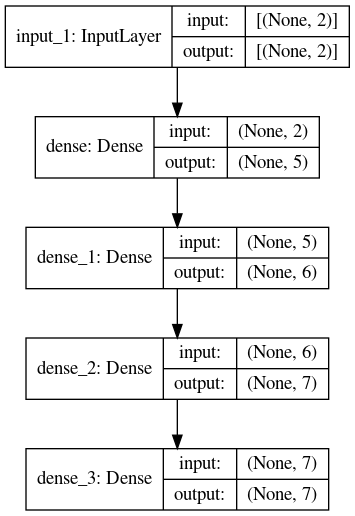

In [600]:
plot_model(model, to_file=path, show_shapes=True, show_layer_names=True)

In [601]:
import os

In [604]:
path = os.path.join(dir_model, save_name + f'.{v}')
path

'../saved_models/model_6.9'

In [605]:
model.save(path)

INFO:tensorflow:Assets written to: ../saved_models/model_6.9/assets


In [606]:
model

In [152]:
from tensorflow.keras.models import load_model

In [153]:
model = load_model(path)

In [157]:
nn = NeuralNetwork(df[pa_fields], df[seven_fields], model)